In [11]:
import lumicks.pylake as lk
import os
import matplotlib.pyplot as plt
import numpy as np

# Use widget if you're using Jupyter lab or noteboo
# %matplotlib widget

# Use notebook if you're in nbclassic
%matplotlib notebook

## Download the kymograph data

In [12]:
folder_path = r'/Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250708_graphFigure1_M18wt/ATP_lower_C/' # change path
h5_files = [f for f in os.listdir(folder_path) if f.endswith('.h5')]
for file in h5_files:
    print(file)

20250708-175413 Kymograph 30.h5
20250708-174630 Kymograph 27.h5
20250708-173823 Kymograph 24.h5
20250708-174915 Kymograph 28.h5
20250708-173545 Kymograph 23_lower_concentration.h5


In [13]:
file_name = '20250708-175413 Kymograph 30.h5' # pick file
file_path = os.path.join(folder_path, file_name)
file = lk.File(file_path)

## Plotting the kymograph

Let’s load our Bluelake data and have a look at what the kymograph looks like. We can easily grab the kymo by calling `popitem()` on the list of kymos, which returns the first kymograph:

In [10]:
_, kymo = file.kymos.popitem()

In this experiment, force was measured alongside the kymograph. Let’s plot them together to get a feel for what the data looks like:

<IPython.core.display.Javascript object>


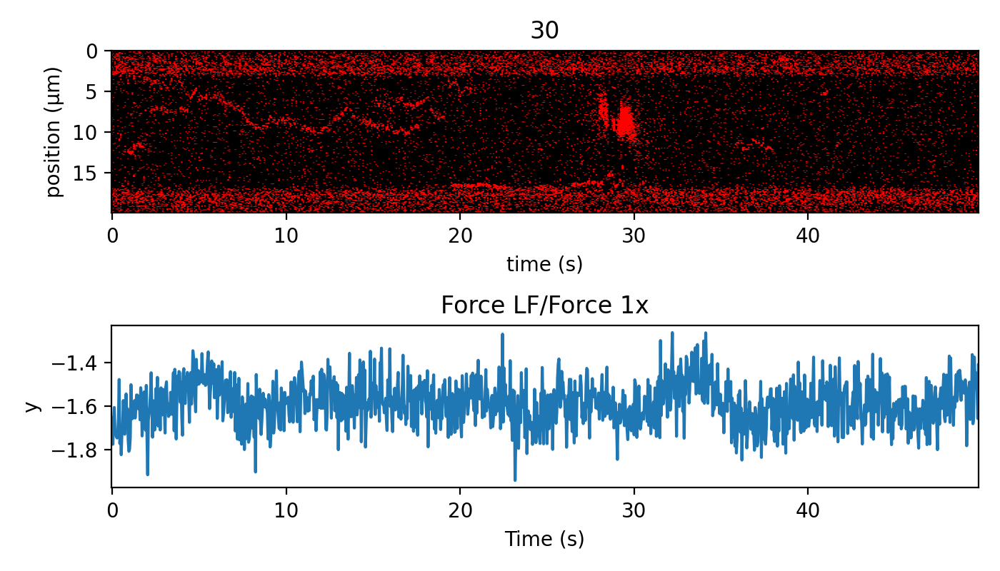

In [15]:
plt.figure(figsize=(7, 4))

# Plot the kymograph
ax1 = plt.subplot(2, 1, 1)

adjustment = lk.ColorAdjustment(0, 1)

# We use aspect="auto" because otherwise the kymograph would be very long and thin
kymo.plot("red", adjustment=adjustment, aspect="auto")

# Plot the force
ax2 = plt.subplot(2, 1, 2, sharex = ax1)
plt.xlim(ax1.get_xlim())
file["Force LF"]["Force 1x"].plot()
plt.tight_layout()


plt.show()

<IPython.core.display.Javascript object>


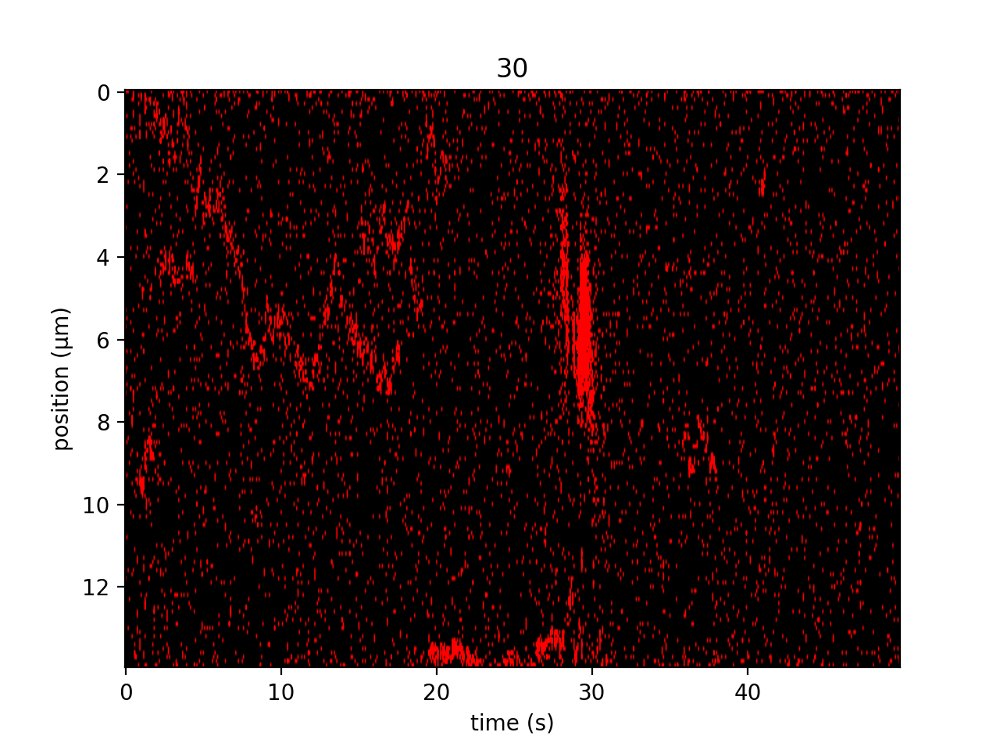

In [18]:
#select region and bin

kymo_reg= kymo["0s":"150s"]
kymo_reg = kymo_reg.crop_by_distance(3, 17)
kymo_reg_ds = kymo_reg.downsampled_by(1)

plt.figure()
kymo_reg_ds.plot("red", aspect="auto", adjustment=adjustment)
plt.show()

## Performing the kymotracking

Now that we’ve loaded some data, we can begin tracking lines on it. For this, we open the widget. This will provide us with a view of the kymograph and some dials to tune in algorithm settings. We open with a custom `axis_aspect_ratio` which determines our field of view. This input is not necessary, but provides a better view of our data.

We will be using the greedy algorithm. For more information on how it works, please refer to the [Pylake kymotracking tutorial](https://lumicks-pylake.readthedocs.io/en/stable/examples/cas9_kymotracking/../../tutorial/kymotracking.html#track-greedy). The `threshold` should typically be chosen somewhere between the expected baseline photon count and the photon count of a true track (note that you can see the local photon count between square brackets while hovering over the kymograph). The `track width` should roughly be set to the expected spot size (in the spatial dimension) of a track. The `window` should be chosen such that small gaps in a track can be overcome, but not so large that spurious points may be strung together as a track. `Sigma` controls how much the location can fluctuate from one time point to the next, while the `min length` determines how many peak points should be in a track for it to be considered a valid track. The optional `adjacency_filter` removes detections that have no detections in their neighboring frame (prior to tracking) which can cut down on noise.

Holding down the left mouse button and dragging pans the view, while the right mouse button allows us to drag a region where we should perform tracking. Any track which overlaps with the selected area will be removed before tracking new ones.

The icon with the little square can be used to toggle zoom mode, which will allow you to zoom in one subsection of the kymograph. Clicking it again brings us back out of zoom mode. You can zoom out again by clicking the home button. Quite often, it is beneficial to find some adequate settings for track all, and then fine-tune the results using the manual rectangle selection. It’s not mandatory to use the same settings throughout the kymograph. For example, if you see a particular event where two tracks are disconnected but should be connected, temporarily increase the window size and just drag a rectangle over that particular track while having the option `Track` enabled.

Now, let’s do some tracking. There are two ways to approach this analysis. The first is to just use the rectangle selection, which can be quite time intensive. Alternatively, you can use `Track All` to simply track the entire kymograph, and then remove spurious detections by hand. This can be good to get a feel for the parameters as well. If we select the `Remove Tracks` mode we will start removing tracks without grabbing new ones. This functionality can be used to remove spurious detections.

Finally, if you wish to connect two tracks in the kymograph manually, you can switch to the `Connect Tracks` mode. In this mode you can click a point in one track with the right mouse button and connect it to another by dragging to a point in the track you wish to connect it to.

Note that in this data for example, there are some regions where fluorescence starts building up on the surface of the bead. This binding should be omitted from the analysis:

In [20]:
kymowidget = lk.KymoWidgetGreedy(
    kymo_reg_ds,
    "red",
    adjustment = lk.ColorAdjustment(0, 4),
    axis_aspect_ratio=1,
    
    pixel_threshold=0.5,
    sigma=0.4,
    window=6,
    min_length=8,
    vmax=8,
    #adjacency_filter=True,
    #cmap="viridis",
    cmap="grey",
    correct_origin=True
)
from IPython.display import display, HTML

plt.grid(False)

# Set a larger height for widget areas
display(HTML("""
<style>
.output_scroll {
    overflow: visible !important;
    height: auto !important;
    max-height: none !important;
}
</style>
"""))


One last thing to note is that we assigned the [`KymoWidgetGreedy`](https://lumicks-pylake.readthedocs.io/en/stable/examples/cas9_kymotracking/../../_api/lumicks.pylake.KymoWidgetGreedy.html#lumicks.pylake.KymoWidgetGreedy) to the variable `kymowidget`. That means that from this point on, we can interact with it through the handle name `kymowidget`.

Exporting from the widget results in a file that contains the track coordinates in pixels and real units. If we also want to export the photon counts in a region around the track, we can include a `sampling_width`. This sums the photon counts from `pixel_position - sampling_width` to (and including) `pixel_position + sampling_width`:

# Save tracks

In [198]:

# Create a new file name for saving
base_name = os.path.splitext(file_name)[0]  # Remove the .h5 extension
save_file_path = os.path.join(folder_path, f"{base_name}_tracks.txt")  # New file path

# Save the tracks
kymowidget.save_tracks(save_file_path, sampling_width=1)

print(f"Tracks saved to: {save_file_path}")




Tracks saved to: /Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250708/ATP_lower_C/20250708-174915 Kymograph 28_tracks.txt


# Calculate diffusion and create a new folder with results

<IPython.core.display.Javascript object>


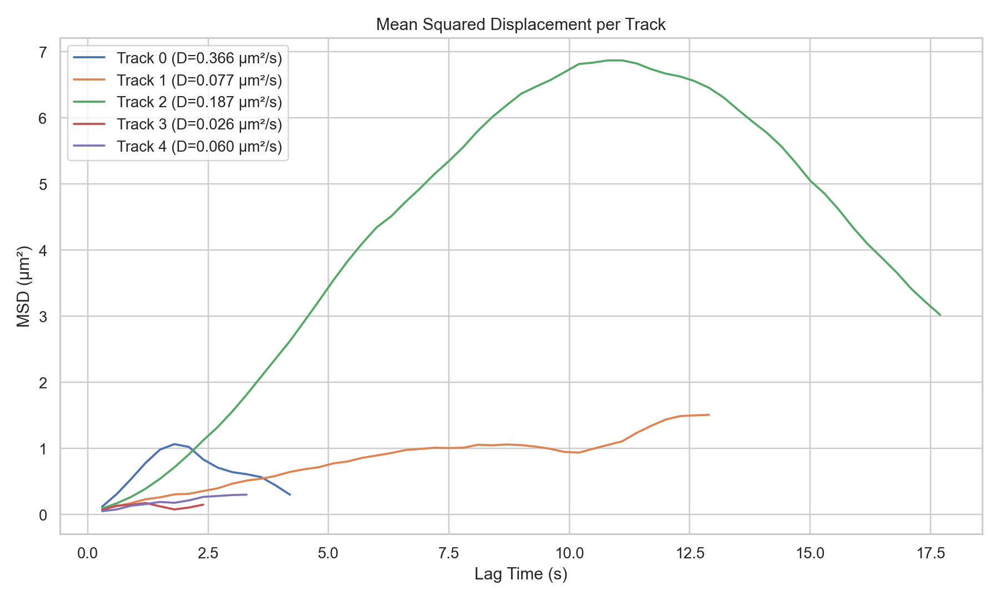

MSD data saved to /Users/a.borsellini/Library/CloudStorage/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250708/ATP_lower_C_diffusion/20250708-174915 Kymograph 28_msd.csv
Diffusion coefficients saved to /Users/a.borsellini/Library/CloudStorage/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250708/ATP_lower_C_diffusion/20250708-174915 Kymograph 28_dc.csv

Estimated Diffusion Coefficients:
Track 0: D = 0.3662 µm²/s
Track 1: D = 0.0767 µm²/s
Track 2: D = 0.1869 µm²/s
Track 3: D = 0.0255 µm²/s
Track 4: D = 0.0600 µm²/s


In [199]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
import csv

PIXEL_TIME_RESOLUTION = 0.3  # seconds per pixel

def compute_msd(position, dt):
    """Compute Mean Squared Displacement given position and time interval (dt)."""
    n = len(position)
    max_lag = n // 2  # Maximum lag to consider
    msd = []

    for lag in range(1, max_lag):
        displacements = position[lag:] - position[:-lag]
        squared_displacement = displacements ** 2
        msd.append(np.mean(squared_displacement))

    lag_times = np.arange(1, max_lag) * dt  # Lag times in seconds
    return lag_times, np.array(msd)

diffusion_results = []
all_msd_data = []

plt.figure(figsize=(10, 6))

for i, track in enumerate(kymowidget.tracks):
    try:
        # Extract position and calculate time points based on 0.3 second resolution
        position = np.array(track.position)  # positions in micrometers
        time = np.arange(len(position)) * PIXEL_TIME_RESOLUTION  # time in seconds, with correct scaling

        if len(position) < 3:
            print(f"Skipping track {i}: too short")
            continue

        # Compute MSD
        lags, msd = compute_msd(position, PIXEL_TIME_RESOLUTION)

        # Linear regression on first few points (assume linear regime)
        num_points = min(5, len(msd))
        slope, intercept, r_value, _, _ = linregress(lags[:num_points], msd[:num_points])
        diffusion_coeff = slope / 2  # for 1D diffusion

        diffusion_results.append((i, diffusion_coeff))

        # Plot MSD
        plt.plot(lags, msd, label=f'Track {i} (D={diffusion_coeff:.3f} µm²/s)')
        
        # Store MSD data for CSV export
        for lag, m in zip(lags, msd):
            all_msd_data.append([i, lag, m])

    except AttributeError:
        print(f"Skipping track {i}: missing position data")

plt.xlabel("Lag Time (s)")
plt.ylabel("MSD (µm²)")
plt.title("Mean Squared Displacement per Track")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Assuming you have a variable `file_name` that holds the kymograph file name
base_name = os.path.splitext(file_name)[0]  # Remove extension from kymograph name

# Define the directory for saving the files
save_directory = os.path.join(os.getcwd(), "ATP_lower_C_diffusion")  # Working directory + subfolder

# Create the directory if it doesn't exist
os.makedirs(save_directory, exist_ok=True)

# Define the file paths based on the kymograph file name
msd_file_path = os.path.join(save_directory, f"{base_name}_msd.csv")
diffusion_file_path = os.path.join(save_directory, f"{base_name}_dc.csv")

# Save MSD data to CSV
with open(msd_file_path, mode='w', newline='') as msd_file:
    writer = csv.writer(msd_file)
    writer.writerow(["Track Index", "Lag Time (s)", "MSD (µm²)"])  # Write header
    writer.writerows(all_msd_data)

print(f"MSD data saved to {msd_file_path}")

# Save diffusion coefficients to CSV
with open(diffusion_file_path, mode='w', newline='') as diff_file:
    writer = csv.writer(diff_file)
    writer.writerow(["Track Index", "Diffusion Coefficient (µm²/s)"])  # Write header
    writer.writerows(diffusion_results)

print(f"Diffusion coefficients saved to {diffusion_file_path}")

# Print summary
if diffusion_results:
    print("\nEstimated Diffusion Coefficients:")
    for idx, D in diffusion_results:
        print(f"Track {idx}: D = {D:.4f} µm²/s")
else:
    print("No valid tracks to calculate diffusion.")

# COMBINE DIFFUSION FROM ALL MSD

<IPython.core.display.Javascript object>


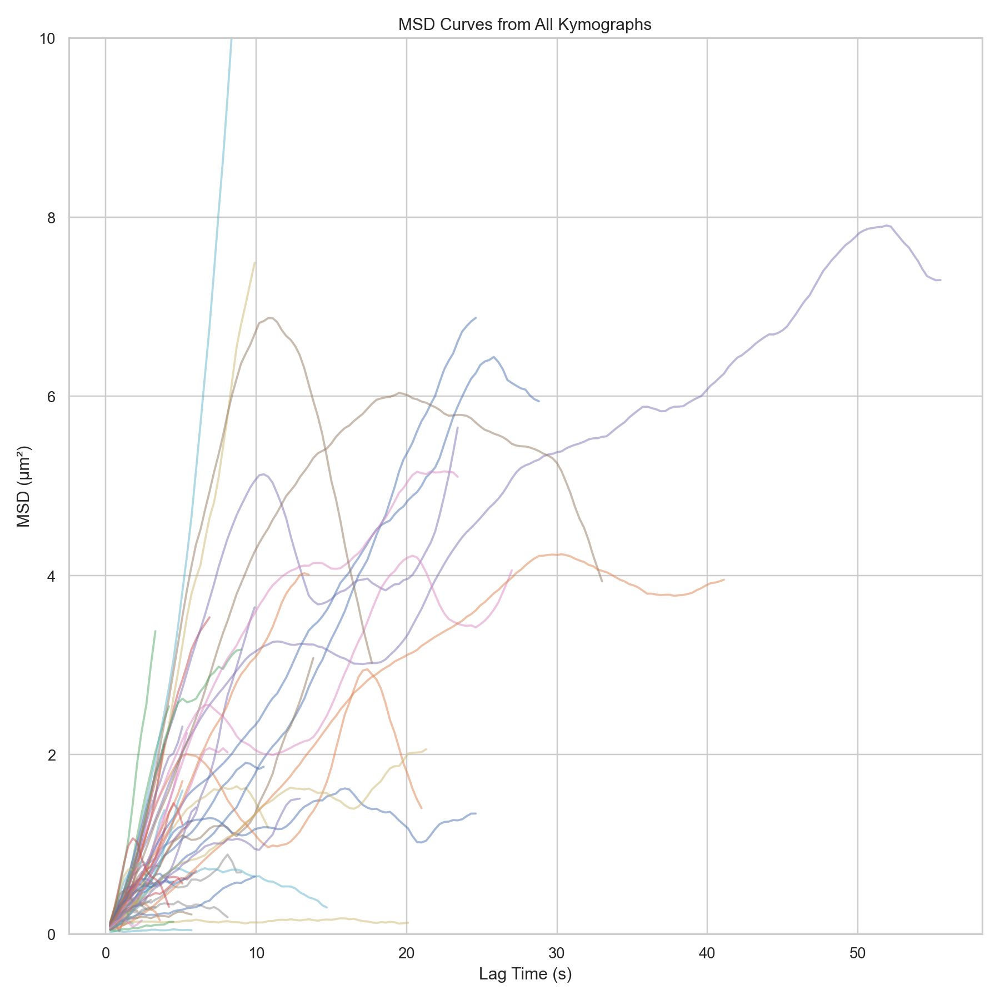

In [200]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt

# Path to the folder containing the CSV files
folder_path = os.path.join(os.getcwd(), "ATP_lower_C_diffusion")

# Find all MSD files
msd_files = glob.glob(os.path.join(folder_path, "*_msd.csv"))

plt.figure(figsize=(10, 10))

# Loop through each file and plot the data
for msd_file in msd_files:
    df = pd.read_csv(msd_file)
    
    # Plot each track without labels
    for _, group in df.groupby("Track Index"):
        plt.plot(group["Lag Time (s)"], group["MSD (µm²)"], alpha=0.5)

plt.xlabel("Lag Time (s)")
plt.ylabel("MSD (µm²)")
plt.title("MSD Curves from All Kymographs")
plt.ylim(0, 10)  # Set Y-axis range
plt.grid(True)
plt.tight_layout()
plt.show()

# COMPARISON BETWEEN CONDITIONS

<IPython.core.display.Javascript object>


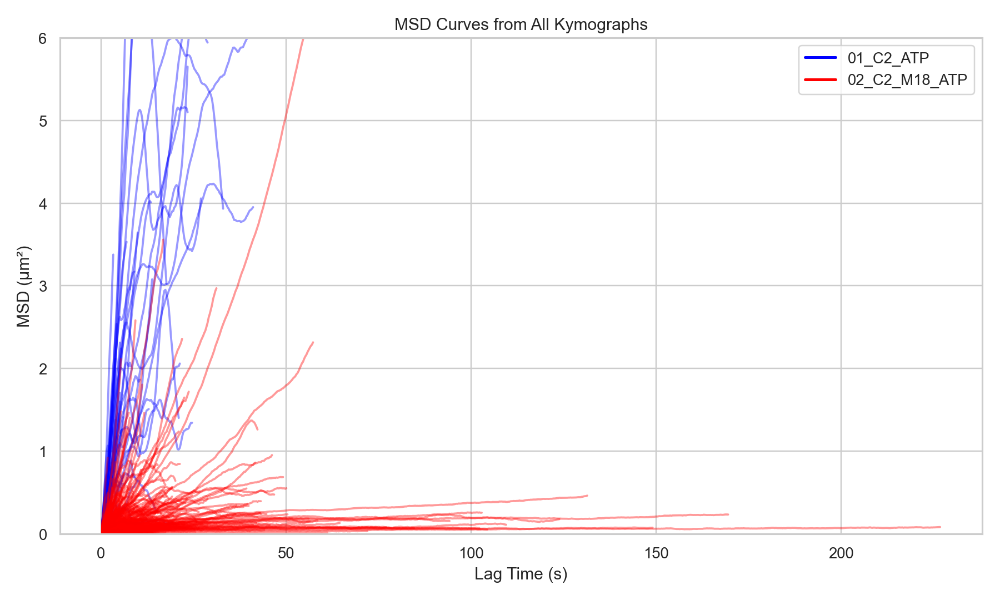

In [201]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt

# Define folders and their corresponding colors
folders = {
    "ATP_lower_C_diffusion": "blue",
    "ATP_M18_diffusion": "red"
}

plt.figure(figsize=(10, 6))

for folder_name, color in folders.items():
    folder_path = os.path.join(os.getcwd(), folder_name)
    msd_files = glob.glob(os.path.join(folder_path, "*_msd.csv"))

    for msd_file in msd_files:
        df = pd.read_csv(msd_file)

        # Plot each track in the assigned color
        for _, group in df.groupby("Track Index"):
            plt.plot(group["Lag Time (s)"], group["MSD (µm²)"], alpha=0.4, color=color)

# Customize plot
plt.xlabel("Lag Time (s)")
plt.ylabel("MSD (µm²)")
plt.title("MSD Curves from All Kymographs")
plt.ylim(0, 6)
plt.grid(True)
plt.tight_layout()

# Add custom legend
from matplotlib.lines import Line2D
custom_lines = [
    Line2D([0], [0], color='blue', lw=2, label='01_C2_ATP'),
    Line2D([0], [0], color='red', lw=2, label='02_C2_M18_ATP')
]
plt.legend(handles=custom_lines)

plt.show()

# GRAPH DIFFUSION COEFFICIENT vs LAG TIME

<IPython.core.display.Javascript object>


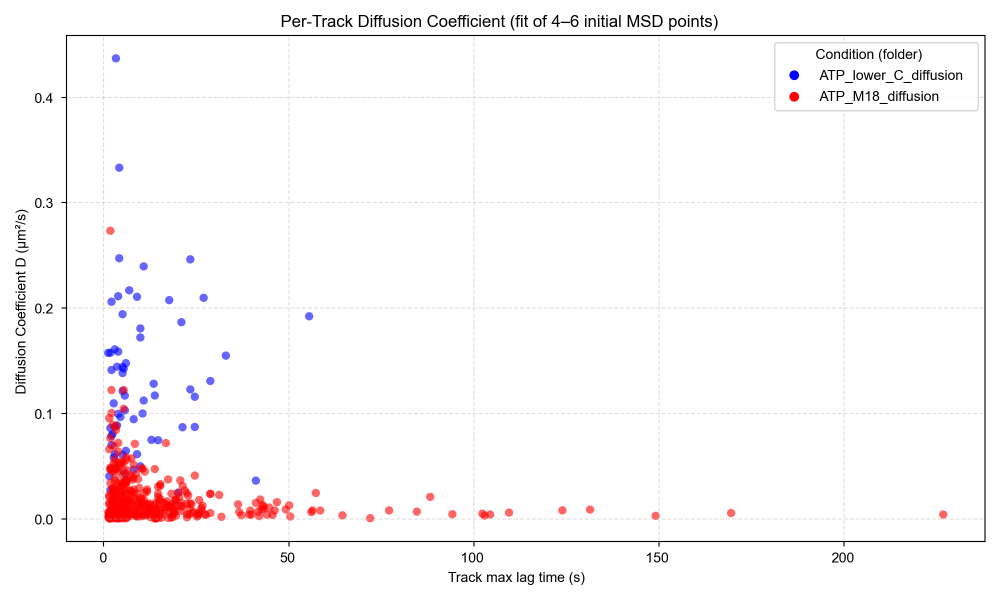


Average Diffusion Constant by Condition:
            Condition  N_tracks   D_mean    D_std    D_SEM
ATP_lower_C_diffusion        67 0.124676 0.077850 0.009511
    ATP_M18_diffusion       377 0.019077 0.023707 0.001221
[Overall] Pearson r=-0.136 (p=0.00406), Spearman ρ=-0.186 (p=7.92e-05)
[ATP_lower_C_diffusion] Pearson r=0.080 (p=0.518), Spearman ρ=0.144 (p=0.245)
[ATP_M18_diffusion] Pearson r=-0.193 (p=0.000161), Spearman ρ=-0.198 (p=0.00011)

--- Diffusion comparison for lag times > 20s vs ≤ 20s ---
[ATP_lower_C_diffusion]  N≤20s=55, N>20s=12, mean D≤20s=0.1229, mean D>20s=0.1328, ΔD=+8.1%
[ATP_M18_diffusion]  N≤20s=300, N>20s=77, mean D≤20s=0.02123, mean D>20s=0.0107, ΔD=-49.6%

Percentage difference in diffusion coefficient by lag time group:
            Condition  N≤20s  N>20s  Mean D≤20s  Mean D>20s  % Difference
ATP_lower_C_diffusion     55     12    0.122900    0.132816      8.067963
    ATP_M18_diffusion    300     77    0.021228    0.010697    -49.610210


In [12]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.stats import pearsonr, spearmanr  # optional; remove if not needed

# ----------------------------
# User settings
# ----------------------------
folders = {
    "ATP_lower_C_diffusion": "blue",
    "ATP_M18_diffusion": "red",
}
dimension = 1         # 1 for kymographs (1D diffusion)
fit_min = 4           # minimum number of points to fit
fit_max = 6           # maximum number of points to fit
alpha_point = 0.6
s_point = 36
ylim = (None, None)
savefig = None        # e.g., "D_vs_tau_points_fit6.png"
x_value_mode = "max_tau"   # or "mean_fit_tau"
# ----------------------------

plt.figure(figsize=(10, 6))
legend_handles = []

# For optional correlation output
all_x, all_y = [], []
per_cond_xy = {cond: {"x": [], "y": []} for cond in folders.keys()}

for folder_name, color in folders.items():
    folder_path = os.path.join(os.getcwd(), folder_name)
    msd_files = glob.glob(os.path.join(folder_path, "*_msd.csv"))

    if not msd_files:
        print(f"[WARN] No *_msd.csv files found in: {folder_path}")
        continue

    legend_handles.append(Line2D([0], [0], color=color, marker='o', lw=0, label=folder_name))

    for msd_file in msd_files:
        df = pd.read_csv(msd_file)

        required = {"Track Index", "Lag Time (s)", "MSD (µm²)"}
        if not required.issubset(df.columns):
            print(f"[WARN] Missing required columns in {msd_file}. Skipping.")
            continue

        for _, grp in df.groupby("Track Index"):
            g = grp[["Lag Time (s)", "MSD (µm²)"]].dropna().copy()
            g = g[g["Lag Time (s)"] > 0].sort_values("Lag Time (s)")
            npts = len(g)
            if npts < fit_min:
                continue

            tau = g["Lag Time (s)"].to_numpy()
            msd = g["MSD (µm²)"].to_numpy()

            # Choose how many points to fit: up to fit_max but not exceeding available
            k = min(fit_max, npts)

            # Linear fit on first k points
            coeffs = np.polyfit(tau[:k], msd[:k], 1)
            slope = coeffs[0]
            D = slope / (2.0 * dimension)

            # Optional: skip unphysical negatives
            if D < 0:
                continue

            # X position: either max lag time or mean of fit region
            x_val = float(np.mean(tau[:k]) if x_value_mode == "mean_fit_tau" else np.max(tau))

            plt.scatter(x_val, D, color=color, alpha=alpha_point, s=s_point, edgecolor='none')
            all_x.append(x_val)
            all_y.append(D)
            per_cond_xy[folder_name]["x"].append(x_val)
            per_cond_xy[folder_name]["y"].append(D)

# Axes
plt.xlabel("Track max lag time (s)" if x_value_mode=="max_tau" else "Mean lag time used for fit (s)")
plt.ylabel("Diffusion Coefficient D (µm²/s)")
plt.title("Per-Track Diffusion Coefficient (fit of 4–6 initial MSD points)")
plt.grid(True, ls="--", alpha=0.4)
if any(v is not None for v in ylim):
    plt.ylim(*ylim)
plt.tight_layout()
plt.legend(handles=legend_handles, title="Condition (folder)")

if savefig:
    plt.savefig(savefig, dpi=300)
else:
    plt.show()

# ---------- Compute & print condition averages ----------
summary_rows = []
for cond, xy in per_cond_xy.items():
    D_vals = np.array(xy["y"], dtype=float)
    D_vals = D_vals[np.isfinite(D_vals)]
    N = D_vals.size
    if N == 0:
        continue
    mean = np.mean(D_vals)
    std = np.std(D_vals, ddof=1) if N > 1 else np.nan
    sem = (std / np.sqrt(N)) if (N > 1 and np.isfinite(std)) else np.nan
    summary_rows.append([cond, N, mean, std, sem])

if summary_rows:
    summary_df = pd.DataFrame(summary_rows, columns=["Condition", "N_tracks", "D_mean", "D_std", "D_SEM"])
    print("\nAverage Diffusion Constant by Condition:")
    print(summary_df.to_string(index=False))

# ---------- Optional: correlation diagnostics ----------
def safe_corr(x, y):
    if len(x) >= 3 and np.std(x) > 0 and np.std(y) > 0:
        r_p, p_p = pearsonr(x, y)
        r_s, p_s = spearmanr(x, y)
        return r_p, p_p, r_s, p_s
    return None

overall = safe_corr(all_x, all_y)
if overall:
    r_p, p_p, r_s, p_s = overall
    print(f"[Overall] Pearson r={r_p:.3f} (p={p_p:.3g}), Spearman ρ={r_s:.3f} (p={p_s:.3g})")

for cond, xy in per_cond_xy.items():
    res = safe_corr(xy["x"], xy["y"])
    if res:
        r_p, p_p, r_s, p_s = res
        print(f"[{cond}] Pearson r={r_p:.3f} (p={p_p:.3g}), Spearman ρ={r_s:.3f} (p={p_s:.3g})")
        
# ---------- Compare D for lag time > 20 s vs ≤ 20 s ----------
lag_threshold = 20
print(f"\n--- Diffusion comparison for lag times > {lag_threshold}s vs ≤ {lag_threshold}s ---")

comparison_rows = []
for cond, xy in per_cond_xy.items():
    x_vals = np.array(xy["x"], dtype=float)
    D_vals = np.array(xy["y"], dtype=float)

    # Filter valid entries
    mask = np.isfinite(x_vals) & np.isfinite(D_vals)
    x_vals, D_vals = x_vals[mask], D_vals[mask]
    if len(D_vals) == 0:
        continue

    D_low = D_vals[x_vals <= lag_threshold]
    D_high = D_vals[x_vals > lag_threshold]

    if len(D_low) < 3 or len(D_high) < 3:
        print(f"[{cond}] Not enough data in one of the groups to compare.")
        continue

    mean_low = np.mean(D_low)
    mean_high = np.mean(D_high)

    # Percentage change: (high - low)/low * 100
    percent_diff = ((mean_high - mean_low) / mean_low) * 100

    comparison_rows.append([cond, len(D_low), len(D_high), mean_low, mean_high, percent_diff])
    print(f"[{cond}]  N≤{lag_threshold}s={len(D_low)}, N>{lag_threshold}s={len(D_high)}, "
          f"mean D≤{lag_threshold}s={mean_low:.4g}, mean D>{lag_threshold}s={mean_high:.4g}, "
          f"ΔD={percent_diff:+.1f}%")

if comparison_rows:
    comp_df = pd.DataFrame(comparison_rows,
                           columns=["Condition", f"N≤{lag_threshold}s", f"N>{lag_threshold}s",
                                    f"Mean D≤{lag_threshold}s", f"Mean D>{lag_threshold}s", "% Difference"])
    print("\nPercentage difference in diffusion coefficient by lag time group:")
    print(comp_df.to_string(index=False))




<IPython.core.display.Javascript object>


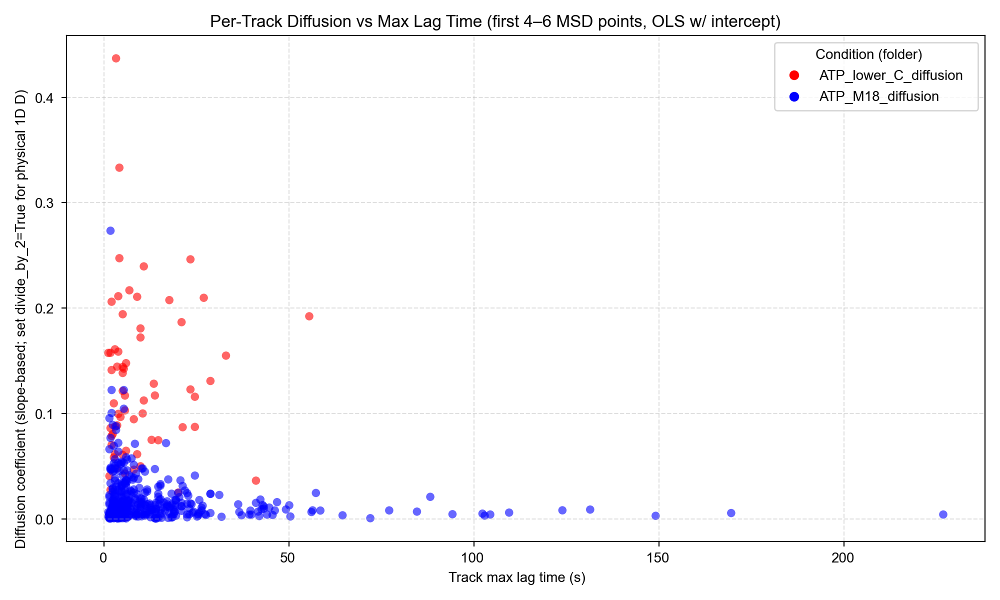

Saved per-track results to: diffusion_results_first4to6_maxlag.csv

Average Diffusion Constant by Condition (after negative-D exclusion; first 4–6 points):
            Condition  N_tracks   D_mean    D_std    D_SEM
    ATP_M18_diffusion       377 0.019077 0.023707 0.001221
ATP_lower_C_diffusion        67 0.124676 0.077850 0.009511


In [21]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.linalg import lstsq

# --------------------------------------
# SETTINGS
# --------------------------------------
folders = {
    "ATP_lower_C_diffusion": "red",
    "ATP_M18_diffusion": "blue",
}

min_points_total = 3        # track must have at least this many points overall
min_track_duration = 1.0    # track must have dt.max() ≥ this (s)
fit_min, fit_max = 4, 6     # use first 4–6 points for the fit
exclude_negative = True     # drop tracks with negative slope (negative D)
divide_by_2 = True         # keep False to match your previous script; set True for physical 1D D

alpha_point = 0.6
s_point = 36
save_csv = "diffusion_results_first4to6_maxlag.csv"  # set None to skip

# --------------------------------------
# OLS with intercept; return slope as D-like (to match your script)
# --------------------------------------
def ols_slope_with_intercept(x, y):
    """
    Fit y = a*x + b using OLS with intercept.
    Returns slope a and sqrt(RSS) (not used in plotting).
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    X = np.vstack([x, np.ones_like(x)]).T
    params, residuals, rank, s = lstsq(X, y)
    slope = float(params[0])
    y_fit = X @ params
    rss = float(((y - y_fit) ** 2).sum())
    return slope, np.sqrt(rss)

plt.figure(figsize=(10, 6))
legend_handles = []
results = []

for folder_name, color in folders.items():
    folder_path = os.path.join(os.getcwd(), folder_name)
    msd_files = [f for f in glob.glob(os.path.join(folder_path, "*.csv")) if f.endswith("_msd.csv")]

    if not msd_files:
        print(f"[WARN] No *_msd.csv files found in: {folder_path}")
        continue

    legend_handles.append(Line2D([0], [0], color=color, marker='o', lw=0, label=folder_name))

    for msd_file in msd_files:
        df = pd.read_csv(msd_file)

        required_cols = {"Track Index", "Lag Time (s)", "MSD (µm²)"}
        if not required_cols.issubset(df.columns):
            print(f"[WARN] Missing columns in {msd_file}. Skipping.")
            continue

        for track_id, group in df.groupby("Track Index"):
            g = group[["Lag Time (s)", "MSD (µm²)"]].dropna().copy()
            g = g[g["Lag Time (s)"] > 0].sort_values("Lag Time (s)")

            # Basic filters
            if len(g) < min_points_total:
                continue
            if g["Lag Time (s)"].max() < min_track_duration:
                continue

            tau_all = g["Lag Time (s)"].to_numpy(float)
            msd_all = g["MSD (µm²)"].to_numpy(float)

            # Fit on the first k points (k between 4 and 6)
            if len(tau_all) < fit_min:
                continue
            k = min(fit_max, len(tau_all))
            tau = tau_all[:k]
            msd = msd_all[:k]

            slope, rss_sqrt = ols_slope_with_intercept(tau, msd)

            # Optional: treat slope as D-like (match previous script), or convert to physical 1D D
            D_val = slope / 2.0 if divide_by_2 else slope

            # Exclude negative D if requested
            if exclude_negative and (D_val < 0 or not np.isfinite(D_val)):
                continue

            # x-value = track's max lag time (over the whole track)
            x_max = float(tau_all.max())

            results.append({
                "Condition": folder_name,
                "Track Index": track_id,
                "D": D_val,
                "slope_raw": slope,
                "RSS_sqrt": rss_sqrt,
                "x_max_lag_time": x_max,
                "k_fit_points": k,
            })

            plt.scatter(x_max, D_val, color=color, alpha=alpha_point, s=s_point, edgecolor='none')

# Plot cosmetics
plt.xlabel("Track max lag time (s)")
plt.ylabel("Diffusion coefficient (slope-based; set divide_by_2=True for physical 1D D)")
plt.title(f"Per-Track Diffusion vs Max Lag Time (first {fit_min}–{fit_max} MSD points, OLS w/ intercept)")
plt.grid(True, ls="--", alpha=0.4)
plt.tight_layout()
plt.legend(handles=legend_handles, title="Condition (folder)")
plt.show()

# Save per-track table
if save_csv and len(results) > 0:
    out_df = pd.DataFrame(results)
    out_df.to_csv(save_csv, index=False)
    print(f"Saved per-track results to: {save_csv}")

# --------- Averages per condition (printed) ----------
if len(results) > 0:
    res_df = pd.DataFrame(results)
    summary = []
    for cond, sub in res_df.groupby("Condition"):
        D_vals = sub["D"].to_numpy(float)
        D_vals = D_vals[np.isfinite(D_vals)]
        N = D_vals.size
        if N == 0:
            continue
        mean = np.mean(D_vals)
        std = np.std(D_vals, ddof=1) if N > 1 else np.nan
        sem = (std / np.sqrt(N)) if (N > 1 and np.isfinite(std)) else np.nan
        summary.append([cond, N, mean, std, sem])

    if summary:
        summary_df = pd.DataFrame(summary, columns=["Condition", "N_tracks", "D_mean", "D_std", "D_SEM"])
        print("\nAverage Diffusion Constant by Condition (after negative-D exclusion; first 4–6 points):")
        print(summary_df.to_string(index=False))


# EXPORT MSD TRACKS FROM  MULTIPLE FILES

In [202]:
import os
import glob
import pandas as pd

# Define folders and their condition labels
folders = {
    "ATP_lower_C_diffusion": "ATP_diffusion"
}

combined_data = []

for folder_name, condition in folders.items():
    folder_path = os.path.join(os.getcwd(), folder_name)
    msd_files = glob.glob(os.path.join(folder_path, "*_msd.csv"))

    for msd_file in msd_files:
        df = pd.read_csv(msd_file)
        df["Condition"] = condition
        combined_data.append(df)

# Concatenate all into one DataFrame
combined_df = pd.concat(combined_data, ignore_index=True)

# Save to CSV for Prism
output_path = os.path.join(os.getcwd(), "combined_msd_data.csv")
combined_df.to_csv(output_path, index=False)

print(f"Combined MSD data saved to: {output_path}")

Combined MSD data saved to: /Users/a.borsellini/Library/CloudStorage/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250708/combined_msd_data.csv


# EXPORT MSD TRACKS FROM  MULTIPLE FILES AND DIVIDE IN COLUMNS FOR EASIER VISUALIZATION IN PRISM

In [203]:
import os
import glob
import pandas as pd

# Define folders and their condition labels
folders = folders = {"ATP_M18_diffusion": "ATP_M18_diffusion"}
all_tracks = []
lag_times = None  # We will store lag time separately

for folder_path, label in folders.items():
    folder_full_path = os.path.join(os.getcwd(), folder_path)
    msd_files = glob.glob(os.path.join(folder_full_path, "*_msd.csv"))

    for file_idx, msd_file in enumerate(msd_files):
        df = pd.read_csv(msd_file)
        track_ids = df["Track Index"].unique()

        for track_id in track_ids:
            track_df = df[df["Track Index"] == track_id][["Lag Time (s)", "MSD (µm²)"]].reset_index(drop=True)
            col_name = f"{label}_{file_idx}_{track_id}"

            if lag_times is None:
                lag_times = track_df["Lag Time (s)"].copy()

            track_df = track_df.rename(columns={"MSD (µm²)": col_name})
            all_tracks.append(track_df[[col_name]])

# Concatenate all columns with lag time at the front
combined_df = pd.concat([lag_times] + all_tracks, axis=1)
combined_df = combined_df.rename(columns={"Lag Time (s)": "Lag Time (s)"})

# Export
output_path = os.path.join(os.getcwd(), "msd_ATP_curves_individual_columns.csv")
combined_df.to_csv(output_path, index=False)
print(f"Exported MSD data with separate columns to: {output_path}")

Exported MSD data with separate columns to: /Users/a.borsellini/Library/CloudStorage/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250708/msd_ATP_curves_individual_columns.csv


# calculate Diffusion constant 

Saved per-track diffusion results to: diffusion_results_first4to6_all_conditions.csv

Average Diffusion Constant by Condition (first 4–6 points, negatives excluded, 1D D = slope/2):
                        Condition  N_tracks   D_mean    D_std    D_SEM
                ATP_M18_diffusion       377 0.019077 0.023707 0.001221
            ATP_lower_C_diffusion        67 0.124676 0.077850 0.009511
CII_0.4nM_M18wt_ADPBeF3_diffusion       135 0.020355 0.032991 0.002839
       CII_0.5nM_M18-7A_diffusion       191 0.106110 0.096887 0.007010


<IPython.core.display.Javascript object>


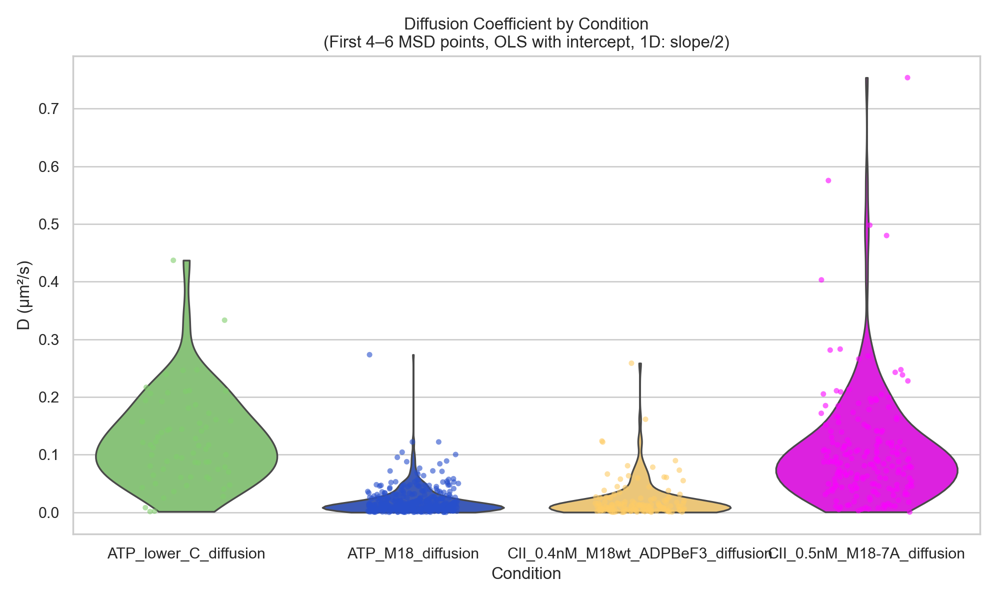

/var/folders/g7/2k4tmvp14dx64r70m5l9gky40000gp/T/ipykernel_17465/3832529592.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/var/folders/g7/2k4tmvp14dx64r70m5l9gky40000gp/T/ipykernel_17465/3832529592.py:152: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


In [24]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.linalg import lstsq

# ----------------------------
# Illustrator-friendly settings
# ----------------------------
mpl.rcParams['pdf.fonttype'] = 42     # keep text as TrueType in PDF
mpl.rcParams['ps.fonttype']  = 42
mpl.rcParams['svg.fonttype'] = 'none' # keep text as text in SVG (not paths)

# ----------------------------
# SETTINGS
# ----------------------------
# Your exact RGB colors (normalized 0–1 for matplotlib)
def rgb(r,g,b): return (r/255.0, g/255.0, b/255.0)
palette = {
    "ATP_lower_C_diffusion": rgb(129,206,109),
    "ATP_M18_diffusion": rgb(39,79,204),
    "CII_0.4nM_M18wt_ADPBeF3_diffusion": rgb(254,204,102),
    "CII_0.5nM_M18-7A_diffusion": rgb(251,2,255),
}

folders = dict(palette)  # same keys define the folders to read

min_points_total = 3        # require at least this many total lag-time points in a track
min_track_duration = 1.0    # require track duration (max lag time) >= 1 s
fit_min, fit_max = 4, 6     # use first 4–6 points for the fit
exclude_negative = True     # drop negative diffusion values
divide_by_2 = True          # convert slope -> physical 1D D = slope/2

save_csv = "diffusion_results_first4to6_all_conditions.csv"  # set None to skip saving
export_base = "Diffusion_by_condition_first4to6_1D"          # base filename for figure export

# ----------------------------
# OLS with intercept; returns slope and sqrt(RSS)
# ----------------------------
def ols_slope_with_intercept(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    X = np.vstack([x, np.ones_like(x)]).T  # design matrix with intercept
    params, residuals, rank, s = lstsq(X, y)
    slope = float(params[0])
    y_fit = X @ params
    rss = float(((y - y_fit) ** 2).sum())
    return slope, np.sqrt(rss)

# ----------------------------
# Collect results
# ----------------------------
results = []

for folder_name, color in folders.items():
    folder_path = os.path.join(os.getcwd(), folder_name)
    msd_files = [f for f in glob.glob(os.path.join(folder_path, "*.csv")) if f.endswith("_msd.csv")]

    if not msd_files:
        print(f"[WARN] No *_msd.csv files found in: {folder_path}")
        continue

    for msd_file in msd_files:
        df = pd.read_csv(msd_file)

        required_cols = {"Track Index", "Lag Time (s)", "MSD (µm²)"}
        if not required_cols.issubset(df.columns):
            print(f"[WARN] Missing required columns in {msd_file}. Skipping.")
            continue

        for track_id, group in df.groupby("Track Index"):
            g = group[["Lag Time (s)", "MSD (µm²)"]].dropna().copy()
            g = g[g["Lag Time (s)"] > 0].sort_values("Lag Time (s)")

            # Basic filters
            if len(g) < min_points_total:
                continue
            if g["Lag Time (s)"].max() < min_track_duration:
                continue

            tau_all = g["Lag Time (s)"].to_numpy(float)
            msd_all = g["MSD (µm²)"].to_numpy(float)

            # Fit on the first k points (k between 4 and 6)
            if len(tau_all) < fit_min:
                continue
            k = min(fit_max, len(tau_all))
            tau_fit = tau_all[:k]
            msd_fit = msd_all[:k]

            slope, rss_sqrt = ols_slope_with_intercept(tau_fit, msd_fit)

            # 1D physical diffusion coefficient
            D_val = slope / 2.0 if divide_by_2 else slope

            # Exclude negative/non-finite
            if exclude_negative and (not np.isfinite(D_val) or D_val < 0):
                continue

            results.append({
                "Condition": folder_name,
                "Track Index": track_id,
                "D": D_val,
                "k_fit_points": k,
            })

# ----------------------------
# Save table & print summary
# ----------------------------
if len(results) == 0:
    raise SystemExit("No valid tracks after filtering. Check folders and CSV contents.")

results_df = pd.DataFrame(results)
if save_csv:
    results_df.to_csv(save_csv, index=False)
    print(f"Saved per-track diffusion results to: {save_csv}")

# Per-condition stats (printed)
summary = []
for cond, sub in results_df.groupby("Condition"):
    D_vals = sub["D"].to_numpy(float)
    D_vals = D_vals[np.isfinite(D_vals)]
    N = D_vals.size
    mean = np.mean(D_vals) if N > 0 else np.nan
    std = np.std(D_vals, ddof=1) if N > 1 else np.nan
    sem = (std / np.sqrt(N)) if (N > 1 and np.isfinite(std)) else np.nan
    summary.append([cond, N, mean, std, sem])

summary_df = pd.DataFrame(summary, columns=["Condition", "N_tracks", "D_mean", "D_std", "D_SEM"])
print("\nAverage Diffusion Constant by Condition (first 4–6 points, negatives excluded, 1D D = slope/2):")
print(summary_df.to_string(index=False))

# ----------------------------
# Plot all conditions together (violin + jitter)
# ----------------------------
sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(10, 6))

sns.violinplot(
    data=results_df,
    x="Condition",
    y="D",
    palette=palette,
    inner=None,
    cut=0,
    ax=ax
)

sns.stripplot(
    data=results_df,
    x="Condition",
    y="D",
    palette=palette,
    dodge=False,
    jitter=0.2,
    size=4,
    alpha=0.6,
    ax=ax
)

ax.set_title("Diffusion Coefficient by Condition\n(First 4–6 MSD points, OLS with intercept, 1D: slope/2)")
ax.set_xlabel("Condition")
ax.set_ylabel("D (µm²/s)")
fig.tight_layout()

# ----------------------------
# Illustrator-editable export
# ----------------------------
# Exports as fully-editable vector graphics with your colors and text preserved
fig.savefig(f"{export_base}.svg", bbox_inches='tight')   # SVG (best for Illustrator)
fig.savefig(f"{export_base}.pdf", bbox_inches='tight')   # PDF (also very editable)

plt.show()


✅ All done. Results saved to 'diffusion_results_gls_1D.csv'.

Average Diffusion Constant (D) by Condition:
                              D   D_error
Condition                                
ATP_lower_C_diffusion  0.247634  0.009704


<IPython.core.display.Javascript object>


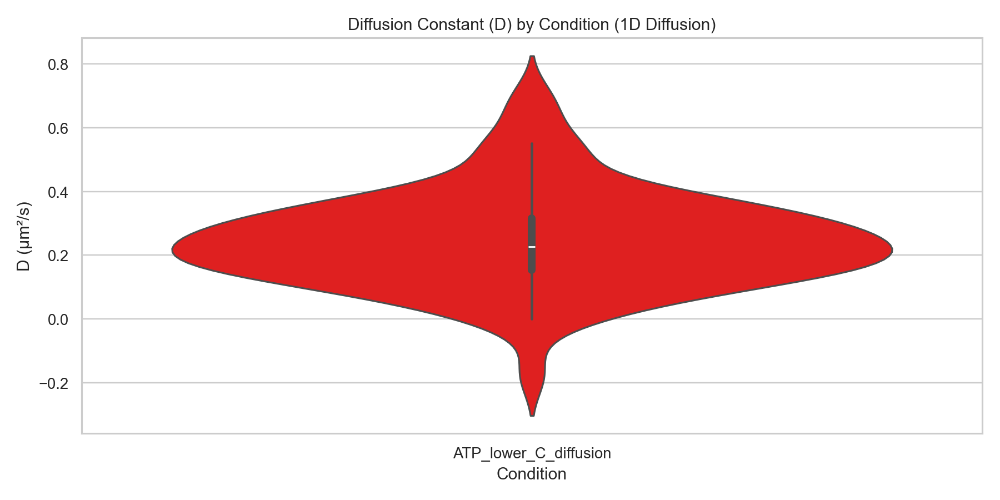

/var/folders/g7/2k4tmvp14dx64r70m5l9gky40000gp/T/ipykernel_90824/2517159075.py:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=results_df, x="Condition", y="D", palette=folders)


In [204]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.linalg import lstsq
import seaborn as sns

# Define the linear model for MSD vs. lag time (τ) for 1D diffusion
def linear_model(x, D):
    return 2 * D * x  # MSD = 2 * D * τ for 1D diffusion

# Function to perform GLS fit
def gls_fit(x, y, model, initial_params):
    # Prepare the design matrix (for linear fitting, it's just the x values)
    X = np.vstack([x, np.ones_like(x)]).T  # Add the intercept term (constant b)
    
    # Solve for parameters using least squares (Ax = b)
    params, residuals, rank, s = lstsq(X, y)
    
    # Return fitted parameters and residuals (errors)
    return params[0], np.sqrt(residuals)  # Return D and the residuals (errors)

# Define folders and their condition labels
folders = {
    "ATP_lower_C_diffusion": "red"
}

# Store results
results = []

# Loop over all folders (conditions)
for folder_name, color in folders.items():
    folder_path = os.path.join(os.getcwd(), folder_name)
    
    # Only process *_msd.csv files (exclude *_dc.csv)
    msd_files = [f for f in glob.glob(os.path.join(folder_path, "*.csv")) if "_msd.csv" in f]

    for msd_file in msd_files:
        df = pd.read_csv(msd_file)

        for track_id, group in df.groupby("Track Index"):
            dt = group["Lag Time (s)"].values
            msd = group["MSD (µm²)"].values

            # Filter out bad tracks: short duration or missing values
            if dt.max() < 1.0 or len(dt) < 3 or np.any(np.isnan(msd)):
                continue

            # Filter the data to fit MSD between 0.15 < τ < 1.0 seconds for linear fit
            mask = (dt > 0.15) & (dt < 1.0)  # Filtering within this range
            dt_filtered = dt[mask]
            msd_filtered = msd[mask]

            # Check if there are enough points for the fit
            if len(dt_filtered) < 3:  # We need at least 3 points for the linear fit
                continue

            # Perform the GLS fit to calculate D
            D, residuals = gls_fit(dt_filtered, msd_filtered, linear_model, initial_params=[1.0])

            # Append results with fitted D and the associated error
            results.append({
                "Condition": folder_name,
                "Track Index": track_id,
                "D": D,
                "D_error": residuals
            })

# Convert results to DataFrame and save to CSV
results_df = pd.DataFrame(results)
results_df.to_csv("diffusion_results_gls_1D.csv", index=False)
print("✅ All done. Results saved to 'diffusion_results_gls_1D.csv'.")

# -------------------------
# Calculate and Print Averages for D by Condition
# -------------------------

# Remove NaNs from results to ensure accurate averages
averages = results_df.dropna(subset=["D"]).groupby("Condition")[["D", "D_error"]].mean()

# Print the averages for each condition
print("\nAverage Diffusion Constant (D) by Condition:")
print(averages)

# -------------------------
# Plotting D by condition
# -------------------------
sns.set(style="whitegrid")

# Plot: Diffusion constant (D)
plt.figure(figsize=(10, 5))
sns.violinplot(data=results_df, x="Condition", y="D", palette=folders)
plt.title("Diffusion Constant (D) by Condition (1D Diffusion)")
plt.ylabel("D (µm²/s)")
plt.xlabel("Condition")
plt.tight_layout()
plt.show()

In [122]:
!pip install seaborn

# calculate diffusion constant through gaussian fitting

✅ All done. Results saved to 'diffusion_results_gls_1D.csv'.

Average Diffusion Constant (D) by Condition:
                              D   D_error
Condition                                
ATP_lower_C_diffusion  0.247634  0.009704

Fitted Gaussian for ATP_lower_C_diffusion:
Amplitude (A): 3.240034994806242
Mean (mu): 0.2277378093765989
Sigma (σ): 0.11589427743665547


<IPython.core.display.Javascript object>


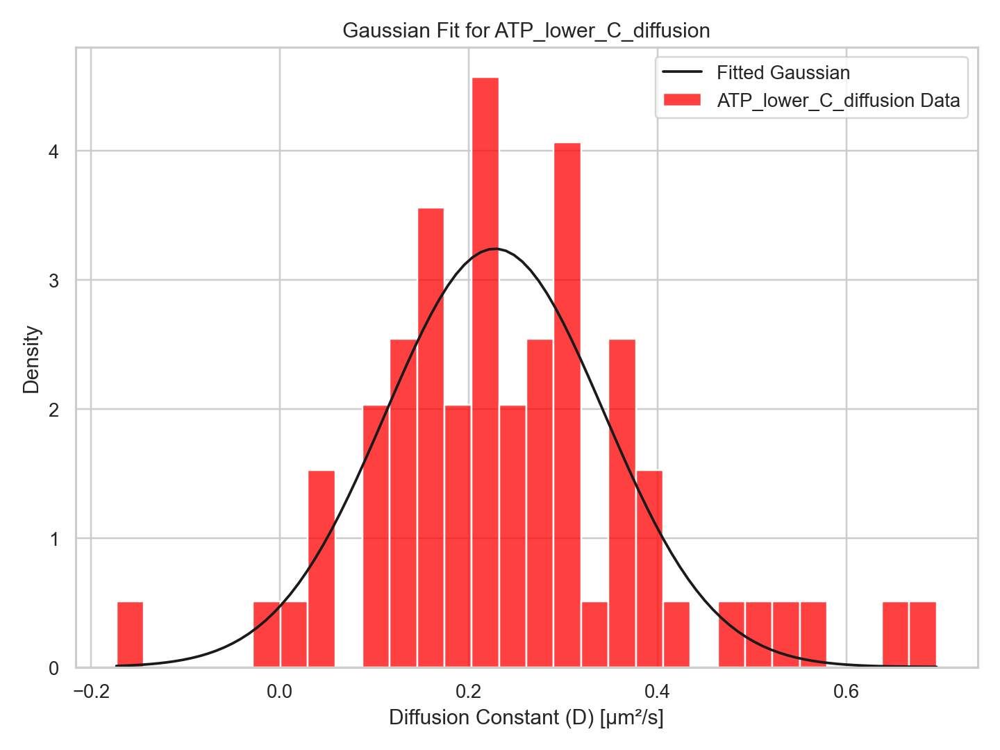

<IPython.core.display.Javascript object>


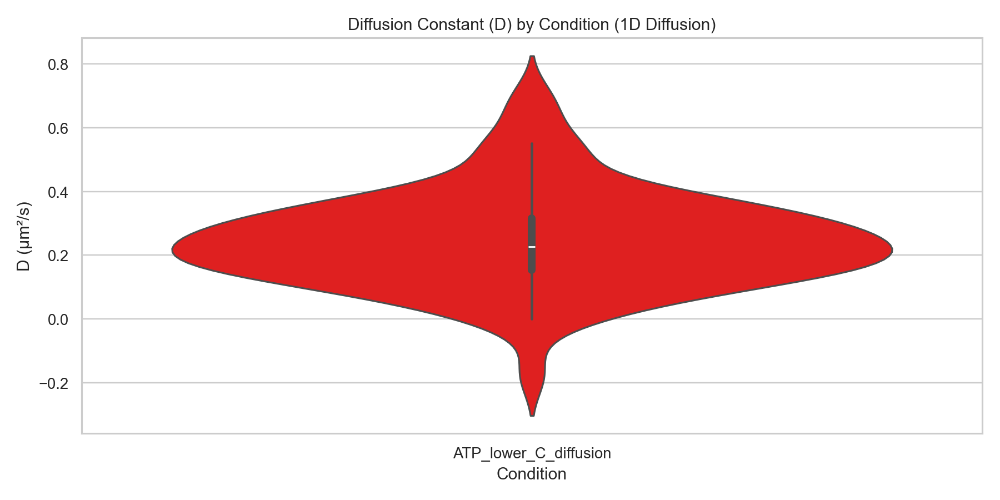

/var/folders/g7/2k4tmvp14dx64r70m5l9gky40000gp/T/ipykernel_90824/2749209107.py:145: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=results_df, x="Condition", y="D", palette=folders)


In [205]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.linalg import lstsq
from scipy.optimize import curve_fit
import seaborn as sns

# Define the linear model for MSD vs. lag time (τ) for 1D diffusion
def linear_model(x, D):
    return 2 * D * x  # MSD = 2 * D * τ for 1D diffusion

# Function to perform GLS fit
def gls_fit(x, y, model, initial_params):
    # Prepare the design matrix (for linear fitting, it's just the x values)
    X = np.vstack([x, np.ones_like(x)]).T  # Add the intercept term (constant b)
    
    # Solve for parameters using least squares (Ax = b)
    params, residuals, rank, s = lstsq(X, y)
    
    # Return fitted parameters and residuals (errors)
    return params[0], np.sqrt(residuals)  # Return D and the residuals (errors)

# Define folders and their condition labels
folders = {
    "ATP_lower_C_diffusion": "red"
}

# Store results
results = []

# Loop over all folders (conditions)
for folder_name, color in folders.items():
    folder_path = os.path.join(os.getcwd(), folder_name)
    
    # Only process *_msd.csv files (exclude *_dc.csv)
    msd_files = [f for f in glob.glob(os.path.join(folder_path, "*.csv")) if "_msd.csv" in f]

    for msd_file in msd_files:
        df = pd.read_csv(msd_file)

        for track_id, group in df.groupby("Track Index"):
            dt = group["Lag Time (s)"].values
            msd = group["MSD (µm²)"].values

            # Filter out bad tracks: short duration or missing values
            if dt.max() < 1.0 or len(dt) < 3 or np.any(np.isnan(msd)):
                continue

            # Filter the data to fit MSD between 0.15 < τ < 1.0 seconds for linear fit
            mask = (dt > 0.15) & (dt < 1.0)  # Filtering within this range
            dt_filtered = dt[mask]
            msd_filtered = msd[mask]

            # Check if there are enough points for the fit
            if len(dt_filtered) < 3:  # We need at least 3 points for the linear fit
                continue

            # Perform the GLS fit to calculate D
            D, residuals = gls_fit(dt_filtered, msd_filtered, linear_model, initial_params=[1.0])

            # Append results with fitted D and the associated error
            results.append({
                "Condition": folder_name,
                "Track Index": track_id,
                "D": D,
                "D_error": residuals
            })

# Convert results to DataFrame and save to CSV
results_df = pd.DataFrame(results)
results_df.to_csv("diffusion_results_gls_1D.csv", index=False)
print("✅ All done. Results saved to 'diffusion_results_gls_1D.csv'.")

# -------------------------
# Calculate and Print Averages for D by Condition
# -------------------------

# Remove NaNs from results to ensure accurate averages
averages = results_df.dropna(subset=["D"]).groupby("Condition")[["D", "D_error"]].mean()

# Print the averages for each condition
print("\nAverage Diffusion Constant (D) by Condition:")
print(averages)

# -------------------------
# Fit Gaussian to Histogram Considering Intensities
# -------------------------

# Define the Gaussian function to fit
def gaussian(x, A, mu, sigma):
    """ Gaussian function for curve fitting """
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Create empty dictionary to hold fitted curve parameters
fitted_params = {}

# Fit Gaussian curve to each condition's data histogram
for condition in folders.keys():
    # Filter the results for the current condition
    condition_data = results_df[results_df["Condition"] == condition]["D"].dropna()
    
    # Create histogram data
    hist, bin_edges = np.histogram(condition_data, bins=30, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2  # Calculate bin centers
    
    # Perform Gaussian fitting using curve_fit
    try:
        # Initial guess for the parameters: A = max(hist), mu = mean, sigma = std
        initial_guess = [max(hist), np.mean(condition_data), np.std(condition_data)]
        
        # Fit the Gaussian function to the data
        params, covariance = curve_fit(gaussian, bin_centers, hist, p0=initial_guess)
        fitted_params[condition] = params
        print(f"\nFitted Gaussian for {condition}:")
        print(f"Amplitude (A): {params[0]}")
        print(f"Mean (mu): {params[1]}")
        print(f"Sigma (σ): {params[2]}")
    except Exception as e:
        print(f"Error fitting Gaussian for {condition}: {e}")
    
    # Plot the histogram and the fitted Gaussian curve
    plt.figure(figsize=(8, 6))
    sns.histplot(condition_data, kde=False, color=color, bins=30, label=f"{condition} Data", stat="density")
    
    # Plot the fitted Gaussian curve
    x_vals = np.linspace(min(condition_data), max(condition_data), 100)
    plt.plot(x_vals, gaussian(x_vals, *params), 'k-', label="Fitted Gaussian")
    
    plt.title(f"Gaussian Fit for {condition}")
    plt.xlabel("Diffusion Constant (D) [µm²/s]")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.show()

# -------------------------
# Plotting D by condition
# -------------------------
sns.set(style="whitegrid")

# Plot: Diffusion constant (D)
plt.figure(figsize=(10, 5))
sns.violinplot(data=results_df, x="Condition", y="D", palette=folders)
plt.title("Diffusion Constant (D) by Condition (1D Diffusion)")
plt.ylabel("D (µm²/s)")
plt.xlabel("Condition")
plt.tight_layout()
plt.show()

# calculate speed for each track

In [15]:
##This script processes tracking data from two experimental conditions. 
##It calculates the speed of each track by computing the difference in position 
##over time and then saves the processed data into new files. 
##The final output is saved in subdirectories with the suffix _speed_calculated 
##appended to the original folder names.

import os
import pandas as pd

# Define the base directory path
base_dir = '/Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250408_C2_0.5nM'

# Subdirectories to process
subdirs = ['01_C2_ATP', '02_C2_M18_ATP']

# Define column names based on the file structure you shared
column_names = ['track_index', 'time_pixels', 'coordinate_pixels', 'time_seconds', 'position_um', 'counts', 'min_observable_duration_seconds']

# Function to calculate speed and save results
def process_tracks_files_in_subdir(subdir):
    subdir_path = os.path.join(base_dir, subdir)
    output_subdir = os.path.join(base_dir, subdir + '_speed_calculated')

    # Create output directory if it doesn't exist
    os.makedirs(output_subdir, exist_ok=True)

    # Iterate over all files in the subdirectory
    for file_name in os.listdir(subdir_path):
        if file_name.endswith('_tracks.txt'):
            file_path = os.path.join(subdir_path, file_name)
            print(f"Processing file: {file_path}")

            try:
                # Load the file into a DataFrame
                df = pd.read_csv(file_path, sep=';', header=0, names=column_names, comment='#')

                # Calculate the speed (change in position divided by change in time)
                df['speed_um_per_s'] = df['position_um'].diff() / df['time_seconds'].diff()

                # Create output file path
                output_file_path = os.path.join(output_subdir, file_name)

                # Save the results (time, position, and speed) to a new file
                df[['time_seconds', 'position_um', 'speed_um_per_s']].to_csv(output_file_path, sep=';', index=False)

                print(f"Speed calculated and saved to: {output_file_path}")
            
            except Exception as e:
                print(f"Error processing file {file_name}: {e}")

# Process both subdirectories
for subdir in subdirs:
    process_tracks_files_in_subdir(subdir)

print("All files processed successfully!")

Processing file: /Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250408_C2_0.5nM/01_C2_ATP/20250408-153949 Kymograph 12_tracks.txt
Speed calculated and saved to: /Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250408_C2_0.5nM/01_C2_ATP_speed_calculated/20250408-153949 Kymograph 12_tracks.txt
Processing file: /Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250408_C2_0.5nM/01_C2_ATP/20250408-154422 Kymograph 13_tracks.txt
Speed calculated and saved to: /Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250408_C2_0.5nM/01_C2_ATP_speed_calculated/20250408-154422 Kymograph 13_tracks.txt
Processing file: /Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250408_C2_0.5nM/01_C2_ATP/20250408-154809 Kymograph 14_tracks.txt
Speed calculated and saved to: /Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20

# calculate average speed

In [48]:
import pandas as pd
import os
import numpy as np

# Function to calculate average speed for a single file
def calculate_average_speed(file_path):
    try:
        df = pd.read_csv(file_path, sep=';', header=0)  # Adjust header row if needed
        
        # Check if the required 'speed_um_per_s' column exists
        if 'speed_um_per_s' not in df.columns:
            print(f"Skipping file {file_path} - 'speed_um_per_s' column not found.")
            return None
        
        # Extract the 'speed' column, remove NaN and infinite values
        speeds = df['speed_um_per_s'].dropna()  # Remove NaN values
        speeds = speeds[np.isfinite(speeds)]  # Remove infinite values
        
        # Check if the speeds array is empty after cleaning
        if len(speeds) == 0:
            print(f"Skipping file {file_path} - no valid speed values found.")
            return None
        
        # Take absolute values of speed
        absolute_speeds = np.abs(speeds)
        
        # Calculate average speed
        average_speed = np.mean(absolute_speeds)
        return average_speed
    
    except Exception as e:
        print(f"Error processing file {file_path}: {e}")
        return None

# Function to calculate average speed for all files in a directory
def calculate_average_speed_for_directory(directory):
    average_speeds = []
    
    # Loop through each file in the directory
    for filename in os.listdir(directory):
        if filename.endswith("_tracks.txt"):  # Make sure it's a tracks file
            file_path = os.path.join(directory, filename)
            avg_speed = calculate_average_speed(file_path)
            if avg_speed is not None:
                average_speeds.append(avg_speed)
    
    # Check if there are any valid average speeds
    if len(average_speeds) == 0:
        print(f"No valid speed data in directory {directory}.")
        return np.nan, np.nan  # Return NaN if no valid speeds are found
    
    # Calculate the overall average and standard error for the condition
    overall_avg_speed = np.mean(average_speeds)
    std_error = np.std(average_speeds) / np.sqrt(len(average_speeds))  # Standard error of the mean
    
    return overall_avg_speed, std_error

# Example usage for the ATP condition
directory_atp = "/Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250408_C2_0.5nM/01_C2_ATP_speed_calculated"
avg_speed_atp, std_error_atp = calculate_average_speed_for_directory(directory_atp)

if not np.isnan(avg_speed_atp):
    print(f"ATP Condition: Average Speed = {avg_speed_atp:.2f} ± {std_error_atp:.2f} um/s")
else:
    print("ATP Condition: No valid speed data found.")

# Example usage for the M18-ATP condition
directory_m18_atp = "/Users/a.borsellini/Dropbox/myFolder/06_HT/03_PAPER_CONDENSIN2_LUMIX/DATA_LUMIX/20250408_C2_0.5nM/02_C2_M18_ATP_speed_calculated"
avg_speed_m18_atp, std_error_m18_atp = calculate_average_speed_for_directory(directory_m18_atp)

if not np.isnan(avg_speed_m18_atp):
    print(f"M18-ATP Condition: Average Speed = {avg_speed_m18_atp:.2f} ± {std_error_m18_atp:.2f} um/s")
else:
    print("M18-ATP Condition: No valid speed data found.")

ATP Condition: Average Speed = 1.33 ± 0.04 um/s
M18-ATP Condition: Average Speed = 0.85 ± 0.01 um/s


# DWELL TIMES

In [209]:
import pandas as pd
import glob
import os

# Settings
min_dwell_time = 0.5  # seconds
output_file = "ATP_lower_C_dwell_times.csv"

# Search only inside ATP_M18 for matching files
track_files = glob.glob("ATP_lower_C/*tracks.txt")

# Store results
all_dwell_data = []

for file_path in track_files:
    try:
        df = pd.read_csv(file_path, sep=';', comment='#', header=None)
        df.columns = [
            'track_id', 'time_px', 'coord_px', 'time_s', 
            'position_um', 'counts', 'min_obs_duration'
        ]
        
        # Calculate dwell time per track
        dwell_times = df.groupby('track_id')['time_s'].agg(lambda x: x.max() - x.min())
        
        # Filter short dwell times
        dwell_times = dwell_times[dwell_times > min_dwell_time]

        # Add source file name as label
        file_label = os.path.basename(file_path)
        all_dwell_data.extend([(file_label, tid, dt) for tid, dt in dwell_times.items()])
        
    except Exception as e:
        print(f"❌ Failed to process {file_path}: {e}")

# Save to CSV
result_df = pd.DataFrame(all_dwell_data, columns=['file', 'track_id', 'dwell_time_s'])
result_df.to_csv(output_file, index=False)

print(f"✅ Dwell times extracted from {len(track_files)} files in 'ATP_lower_C' and saved to '{output_file}'.")


✅ Dwell times extracted from 5 files in 'ATP_lower_C' and saved to 'ATP_lower_C_dwell_times.csv'.


✅ Dwell times saved to 'ATP_M18_dwell_times.csv'


<IPython.core.display.Javascript object>


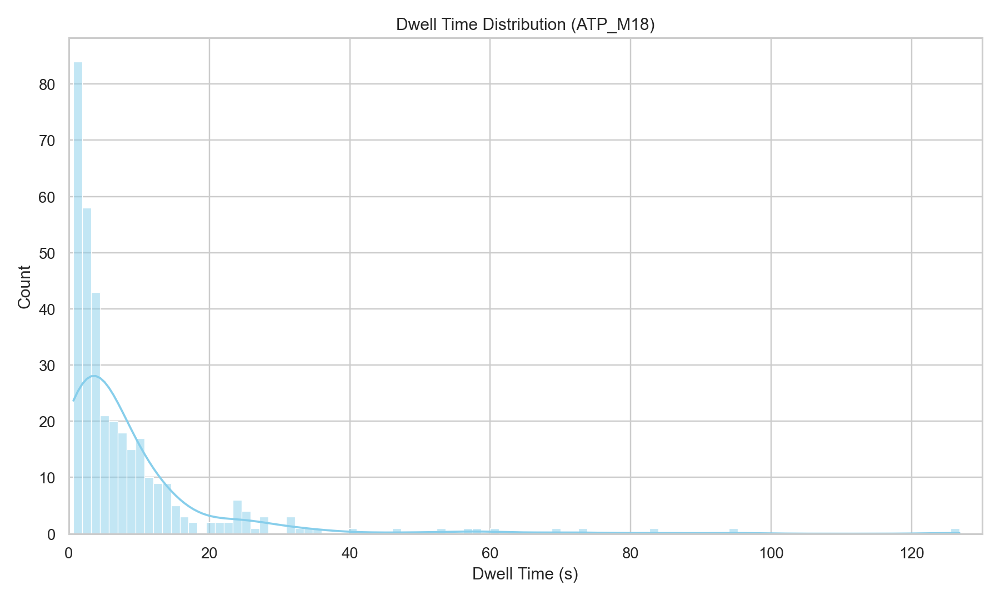


📊 Overall Statistics:
count    351.000000
mean       8.689672
std       13.557937
min        0.666829
25%        2.042163
50%        3.917619
75%        9.877402
max      126.780826
Name: dwell_time_s, dtype: float64

📁 Per-File Statistics:
                                                    count   mean  median  \
file                                                                       
20250708-184313 Kymograph 37_CII_ATP_M18_0.15nM...     73   6.98    3.42   
20250708-184753 Kymograph 38_tracks.txt                44  10.44    5.71   
20250708-185045 Kymograph 39_tracks.txt                59  11.36    7.17   
20250708-185556 Kymograph 41_tracks.txt                83   8.26    3.42   
20250708-190211 Kymograph 43_tracks.txt                92   7.88    3.83   

                                                      std  
file                                                       
20250708-184313 Kymograph 37_CII_ATP_M18_0.15nM...  10.32  
20250708-184753 Kymograph 38_tracks.txt      

In [242]:
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Settings
min_dwell_time = 0.5  # seconds
folder = "ATP_M18"
output_file = f"{folder}_dwell_times.csv"

# Find files
track_files = glob.glob(f"{folder}/*tracks.txt")

# Collect results
all_dwell_data = []

for file_path in track_files:
    try:
        df = pd.read_csv(file_path, sep=';', comment='#', header=None)
        df.columns = [
            'track_id', 'time_px', 'coord_px', 'time_s',
            'position_um', 'counts', 'min_obs_duration'
        ]
        
        dwell_times = df.groupby('track_id')['time_s'].agg(lambda x: x.max() - x.min())
        dwell_times = dwell_times[dwell_times > min_dwell_time]

        file_label = os.path.basename(file_path)
        all_dwell_data.extend([(file_label, tid, dt) for tid, dt in dwell_times.items()])

    except Exception as e:
        print(f"❌ Failed to process {file_path}: {e}")

# Combine results
result_df = pd.DataFrame(all_dwell_data, columns=['file', 'track_id', 'dwell_time_s'])
result_df.to_csv(output_file, index=False)
print(f"✅ Dwell times saved to '{output_file}'")

# --- Plot histogram ---
plt.figure(figsize=(10, 6))
sns.histplot(result_df['dwell_time_s'], bins=100, kde=True, color='skyblue')
plt.xlabel("Dwell Time (s)")
plt.ylabel("Count")
plt.title("Dwell Time Distribution (ATP_M18)")
plt.grid(True)
plt.xlim(0, 130)  # <-- fix x-axis limits here
plt.tight_layout()
plt.show()

# --- Statistics ---
overall_stats = result_df['dwell_time_s'].describe()
print("\n📊 Overall Statistics:")
print(overall_stats)

# Per-file stats (mean & count)
file_stats = result_df.groupby('file')['dwell_time_s'].agg(['count', 'mean', 'median', 'std'])
print("\n📁 Per-File Statistics:")
print(file_stats.round(2))


✅ Dwell times saved to 'ATP_lower_C_dwell_times.csv'


<IPython.core.display.Javascript object>


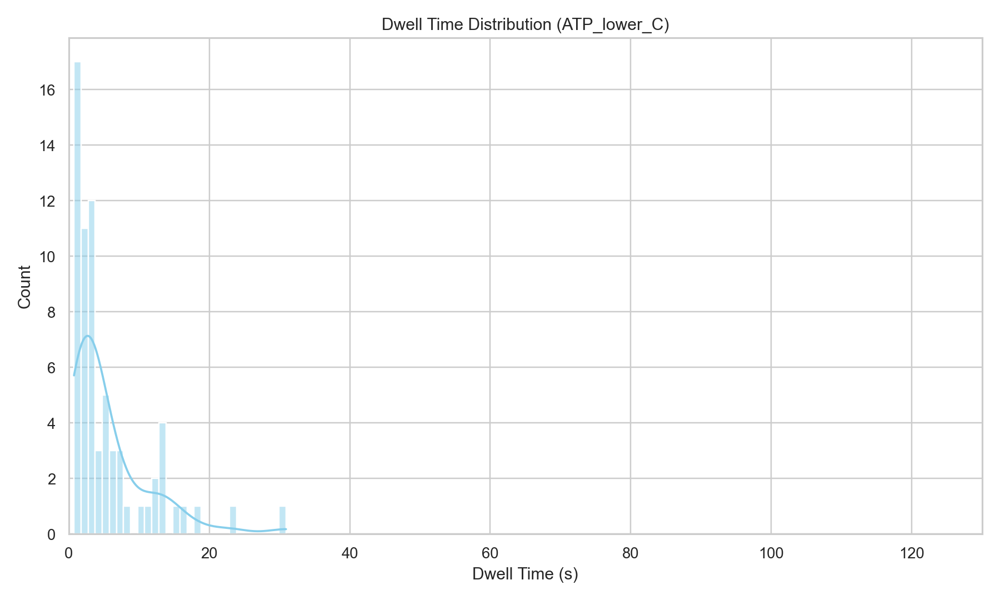


📊 Overall Statistics:
count    68.000000
mean      5.554046
std       5.741426
min       0.750182
25%       1.937971
50%       3.167437
75%       6.439066
max      30.924186
Name: dwell_time_s, dtype: float64

📁 Per-File Statistics:
                                                    count  mean  median   std
file                                                                         
20250708-173545 Kymograph 23_lower_concentratio...     11  4.00    2.92  3.14
20250708-173823 Kymograph 24_tracks.txt                25  7.85    6.17  6.28
20250708-174630 Kymograph 27_tracks.txt                18  4.40    2.79  6.79
20250708-174915 Kymograph 28_tracks.txt                 5  4.63    2.42  3.79
20250708-175413 Kymograph 30_tracks.txt                 9  3.89    3.25  3.72


In [220]:
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Settings
min_dwell_time = 0.5  # seconds
folder = "ATP_lower_C"
output_file = f"{folder}_dwell_times.csv"

# Find files
track_files = glob.glob(f"{folder}/*tracks.txt")

# Collect results
all_dwell_data = []

for file_path in track_files:
    try:
        df = pd.read_csv(file_path, sep=';', comment='#', header=None)
        df.columns = [
            'track_id', 'time_px', 'coord_px', 'time_s',
            'position_um', 'counts', 'min_obs_duration'
        ]
        
        dwell_times = df.groupby('track_id')['time_s'].agg(lambda x: x.max() - x.min())
        dwell_times = dwell_times[dwell_times > min_dwell_time]

        file_label = os.path.basename(file_path)
        all_dwell_data.extend([(file_label, tid, dt) for tid, dt in dwell_times.items()])

    except Exception as e:
        print(f"❌ Failed to process {file_path}: {e}")

# Combine results
result_df = pd.DataFrame(all_dwell_data, columns=['file', 'track_id', 'dwell_time_s'])
result_df.to_csv(output_file, index=False)
print(f"✅ Dwell times saved to '{output_file}'")

# --- Plot histogram ---
plt.figure(figsize=(10, 6))
sns.histplot(result_df['dwell_time_s'], bins=30, kde=True, color='skyblue')
plt.xlabel("Dwell Time (s)")
plt.ylabel("Count")
plt.title("Dwell Time Distribution (ATP_lower_C)")
plt.grid(True)
plt.xlim(0, 130)  # <-- fix x-axis limits here
plt.tight_layout()
plt.show()

# --- Statistics ---
overall_stats = result_df['dwell_time_s'].describe()
print("\n📊 Overall Statistics:")
print(overall_stats)

# Per-file stats (mean & count)
file_stats = result_df.groupby('file')['dwell_time_s'].agg(['count', 'mean', 'median', 'std'])
print("\n📁 Per-File Statistics:")
print(file_stats.round(2))


Statistics of Lag Times (s):
  Mean   : 26.6017
  Median : 12.6000
  Std Dev: 35.2792
  Min    : 0.3000
  Max    : 226.8000


<IPython.core.display.Javascript object>


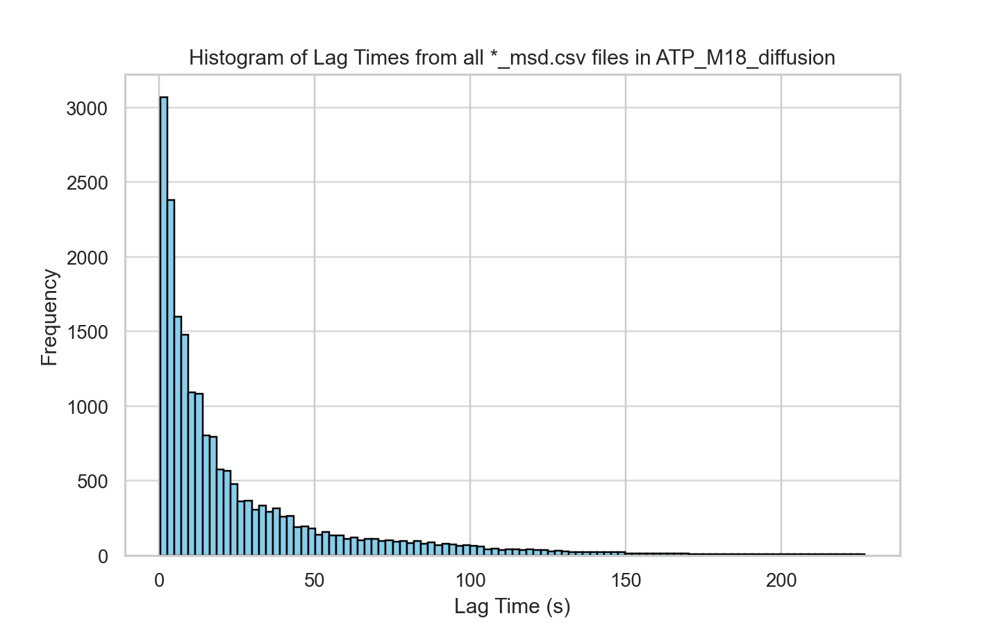

In [245]:
import pandas as pd
import matplotlib.pyplot as plt
import glob

folder = "ATP_M18_diffusion"
files = glob.glob(f"{folder}/*_msd.csv")

lag_times = []

for file in files:
    df = pd.read_csv(file)  # comma-separated by default
    if 'Lag Time (s)' in df.columns:
        lag_times.extend(df['Lag Time (s)'].values)
    else:
        print(f"Warning: 'Lag Time (s)' column not found in {file}")

lag_times_series = pd.Series(lag_times)

# Calculate statistics
average_lag = lag_times_series.mean()
median_lag = lag_times_series.median()
std_lag = lag_times_series.std()
min_lag = lag_times_series.min()
max_lag = lag_times_series.max()

print(f"Statistics of Lag Times (s):")
print(f"  Mean   : {average_lag:.4f}")
print(f"  Median : {median_lag:.4f}")
print(f"  Std Dev: {std_lag:.4f}")
print(f"  Min    : {min_lag:.4f}")
print(f"  Max    : {max_lag:.4f}")

plt.figure(figsize=(8,5))
plt.hist(lag_times_series, bins=100, color='skyblue', edgecolor='black')
plt.xlabel('Lag Time (s)')
plt.ylabel('Frequency')
plt.title('Histogram of Lag Times from all *_msd.csv files in ATP_M18_diffusion')
plt.grid(axis='y', alpha=0.75)
plt.show()

Counts after filtering (≥5s):
 ATP_lower_C_dwell_times.csv: 25
 ATP_M18_dwell_times.csv: 159


<IPython.core.display.Javascript object>


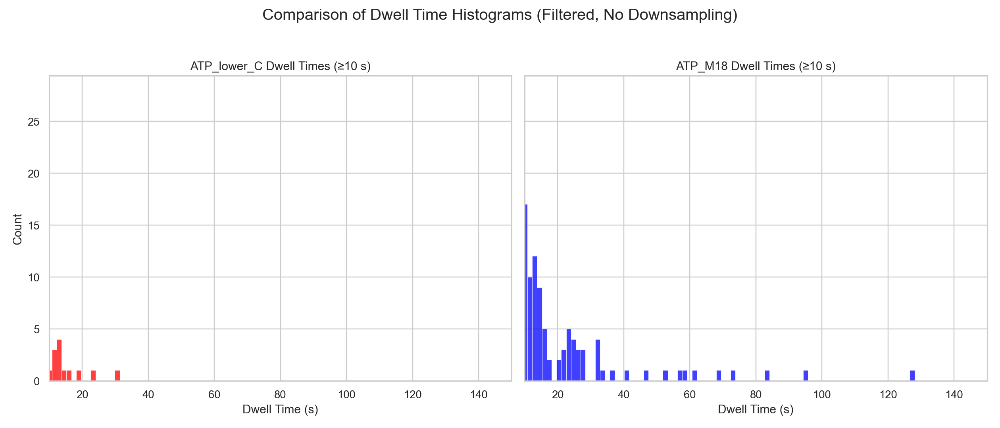

In [250]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load datasets
file1 = "ATP_lower_C_dwell_times.csv"
file2 = "ATP_M18_dwell_times.csv"

df1 = pd.read_csv(file1)
df2 = pd.read_csv(file2)

# Filter out dwell times below 5 seconds
df1 = df1[df1['dwell_time_s'] >= 5].reset_index(drop=True)
df2 = df2[df2['dwell_time_s'] >= 5].reset_index(drop=True)

print(f"Counts after filtering (≥5s):\n {file1}: {len(df1)}\n {file2}: {len(df2)}")

bins = np.linspace(5, 150, 100)  # bins starting at 5 seconds to 150

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Plot ATP_lower_C histogram (red)
sns.histplot(df1['dwell_time_s'], bins=bins, color='red', stat='count', kde=False, ax=axes[0])
axes[0].set_title('ATP_lower_C Dwell Times (≥10 s)')
axes[0].set_xlabel('Dwell Time (s)')
axes[0].set_ylabel('Count')
axes[0].set_xlim(10, 150)
axes[0].grid(True)

# Plot ATP_M18 histogram (blue)
sns.histplot(df2['dwell_time_s'], bins=bins, color='blue', stat='count', kde=False, ax=axes[1])
axes[1].set_title('ATP_M18 Dwell Times (≥10 s)')
axes[1].set_xlabel('Dwell Time (s)')
axes[1].set_xlim(10, 150)
axes[1].grid(True)

plt.suptitle('Comparison of Dwell Time Histograms (Filtered, No Downsampling)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

<IPython.core.display.Javascript object>


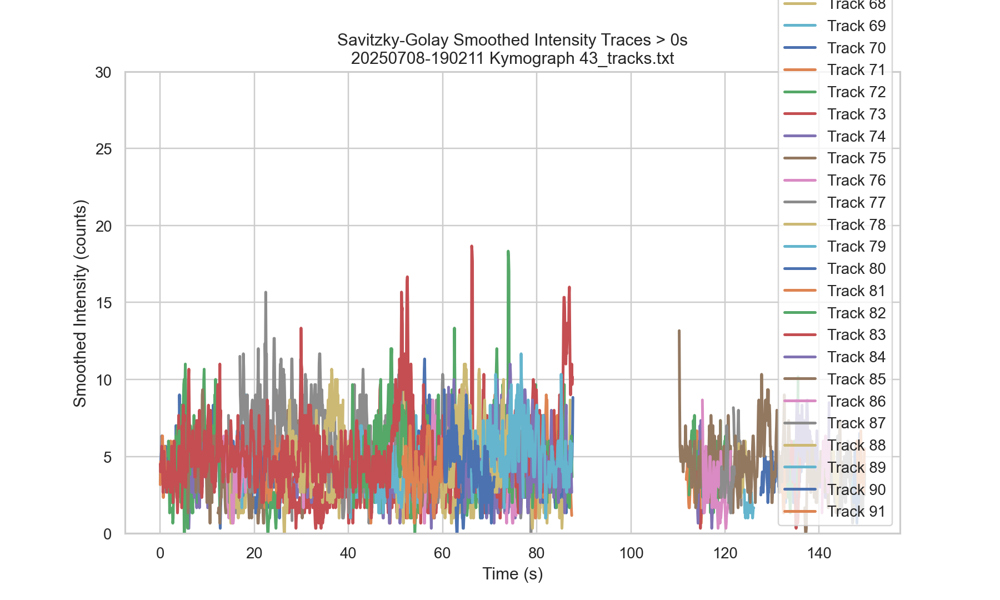

/var/folders/g7/2k4tmvp14dx64r70m5l9gky40000gp/T/ipykernel_90824/1917665415.py:55: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<IPython.core.display.Javascript object>


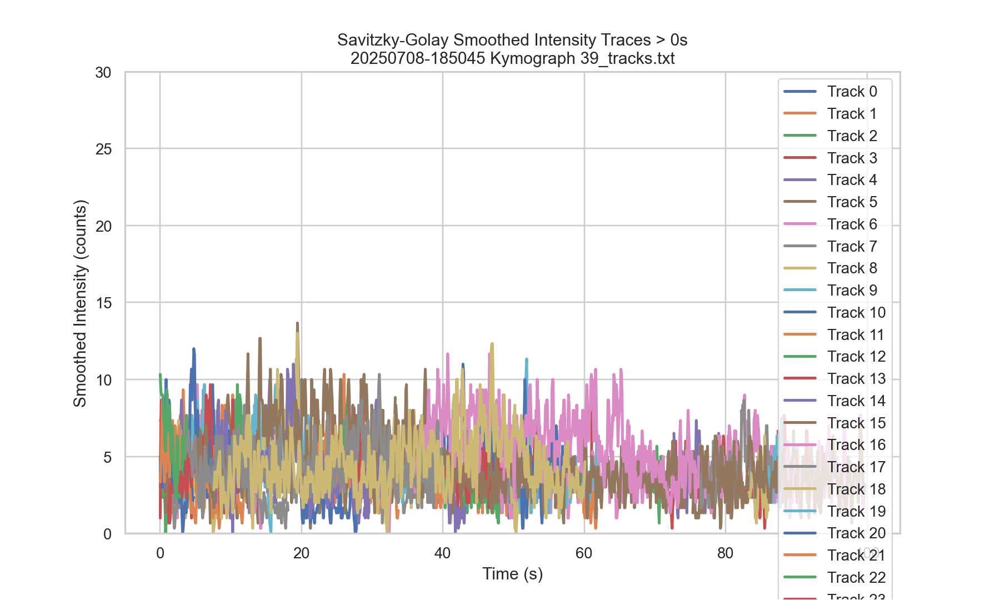

/var/folders/g7/2k4tmvp14dx64r70m5l9gky40000gp/T/ipykernel_90824/1917665415.py:55: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<IPython.core.display.Javascript object>


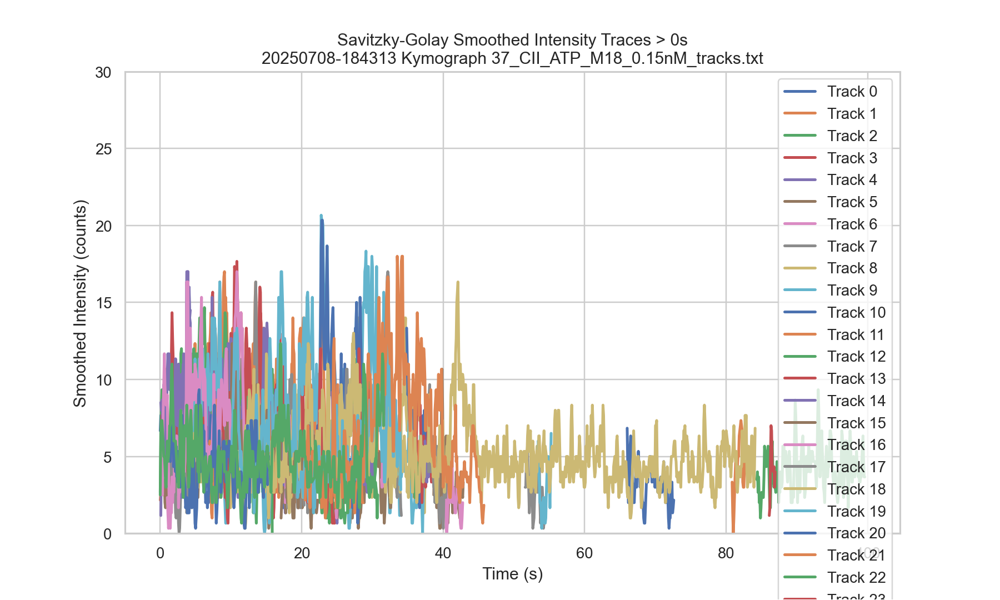

/var/folders/g7/2k4tmvp14dx64r70m5l9gky40000gp/T/ipykernel_90824/1917665415.py:55: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<IPython.core.display.Javascript object>


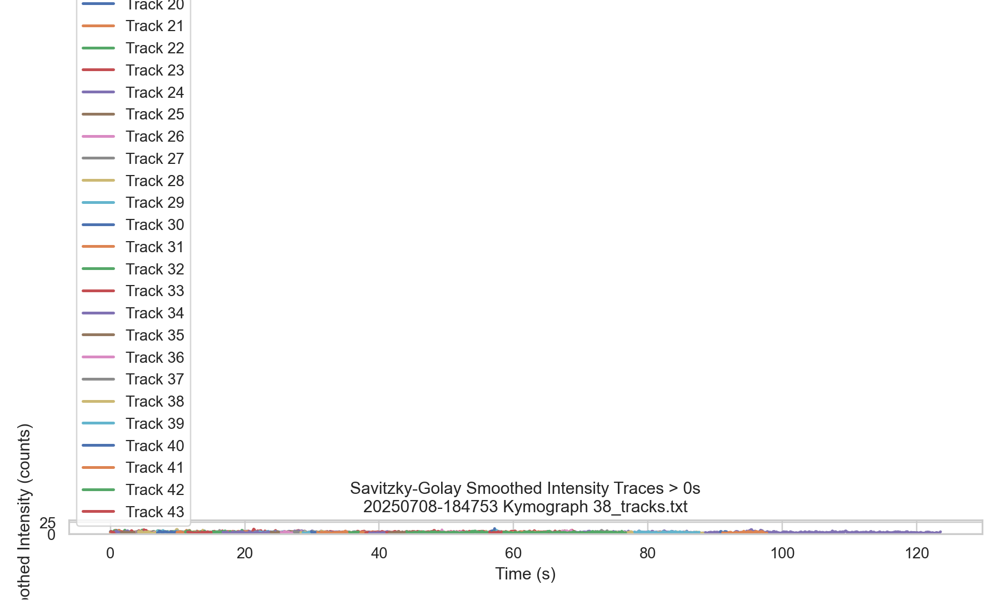

<IPython.core.display.Javascript object>


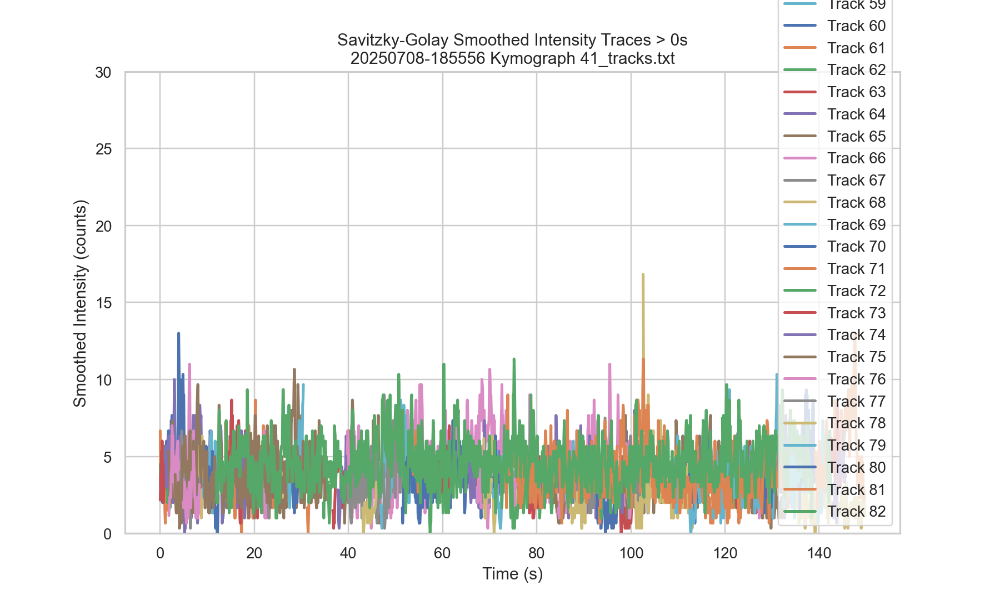

/var/folders/g7/2k4tmvp14dx64r70m5l9gky40000gp/T/ipykernel_90824/1917665415.py:55: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


In [289]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
from scipy.signal import savgol_filter

# --- Parameters ---
folder = "ATP_M18"
min_dwell_time = 0  # seconds
window_length = 3   # must be odd, increase for more smoothing
polyorder = 1        # 2 or 3 recommended

# --- Find track files ---
track_files = glob.glob(f"{folder}/*tracks.txt")

# --- Process each file ---
for file_path in track_files:
    try:
        df = pd.read_csv(file_path, sep=';', comment='#', header=None)
        df.columns = [
            'track_id', 'time_px', 'coord_px', 'time_s',
            'position_um', 'counts', 'min_obs_duration'
        ]

        # Compute dwell time
        dwell_times = df.groupby('track_id')['time_s'].agg(lambda x: x.max() - x.min())
        long_tracks = dwell_times[dwell_times > min_dwell_time].index

        if long_tracks.empty:
            continue

        # --- Plot ---
        plt.figure(figsize=(10, 6))
        for tid in long_tracks:
            track_df = df[df['track_id'] == tid].copy()

            if len(track_df) >= window_length:
                # Apply Savitzky-Golay smoothing
                track_df['smoothed_counts'] = savgol_filter(
                    track_df['counts'], window_length=window_length, polyorder=polyorder
                )
            else:
                # Skip short tracks that can't be smoothed
                continue

            # Plot the smoothed trace
            plt.plot(track_df['time_s'], track_df['smoothed_counts'], label=f'Track {tid}', linewidth=2)

        plt.title(f'Savitzky-Golay Smoothed Intensity Traces > {min_dwell_time}s\n{os.path.basename(file_path)}')
        plt.xlabel("Time (s)")
        plt.ylabel("Smoothed Intensity (counts)")
        plt.ylim(0, 30)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❌ Could not process {file_path}: {e}")


<IPython.core.display.Javascript object>


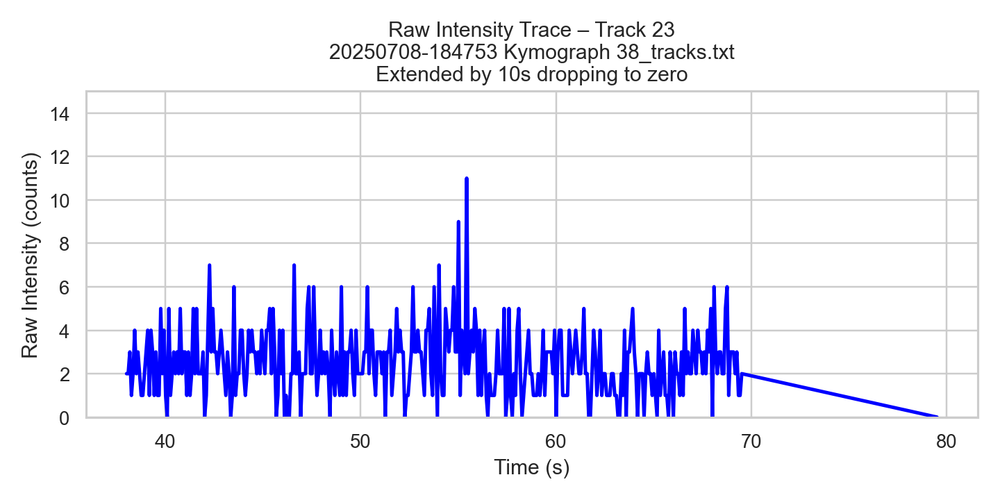

In [301]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Parameters ---
folder = "ATP_M18"
filename = "20250708-184753 Kymograph 38_tracks.txt"
target_track_id = 23
y_limit = 15
extension_sec = 10  # extend by 10 seconds

# --- Full path ---
file_path = os.path.join(folder, filename)

# --- Load data ---
df = pd.read_csv(file_path, sep=';', comment='#', header=None)
df.columns = [
    'track_id', 'time_px', 'coord_px', 'time_s',
    'position_um', 'counts', 'min_obs_duration'
]

# --- Filter for the desired track ---
track_df = df[df['track_id'] == target_track_id].copy()

if track_df.empty:
    print(f"⚠️ Track {target_track_id} not found in file '{filename}'")
else:
    # Last time and intensity
    last_time = track_df['time_s'].iloc[-1]
    last_intensity = track_df['counts'].iloc[-1]

    # Create extension time points (e.g. 20 points linearly spaced over 10s)
    n_points = 20
    extension_times = np.linspace(last_time, last_time + extension_sec, n_points)[1:]  # exclude last_time itself

    # Linearly interpolate counts from last_intensity down to zero
    extension_counts = np.linspace(last_intensity, 0, n_points)[1:]

    # Create dataframe for extension
    extension_df = pd.DataFrame({
        'time_s': extension_times,
        'counts': extension_counts
    })

    # Combine original track with extension
    extended_track_df = pd.concat([track_df[['time_s', 'counts']], extension_df], ignore_index=True)

    # --- Plot ---
    plt.figure(figsize=(8, 4))
    plt.plot(extended_track_df['time_s'], extended_track_df['counts'], color='blue', linewidth=2)
    plt.title(f"Raw Intensity Trace – Track {target_track_id}\n{filename}\nExtended by {extension_sec}s dropping to zero")
    plt.xlabel("Time (s)")
    plt.ylabel("Raw Intensity (counts)")
    plt.ylim(0, y_limit)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [276]:
import pandas as pd
import glob
import os

# Parameters
folder = "ATP_M18"
min_dwell_time = 0  # seconds

# Track all results
mean_intensity_data = []

# Process each file
track_files = glob.glob(f"{folder}/*tracks.txt")

for file_path in track_files:
    try:
        df = pd.read_csv(file_path, sep=';', comment='#', header=None)
        df.columns = [
            'track_id', 'time_px', 'coord_px', 'time_s',
            'position_um', 'counts', 'min_obs_duration'
        ]

        # Compute dwell time
        dwell_times = df.groupby('track_id')['time_s'].agg(lambda x: x.max() - x.min())
        long_lived_ids = dwell_times[dwell_times > min_dwell_time].index

        # Compute mean intensity for each long-lived track
        for tid in long_lived_ids:
            track_df = df[df['track_id'] == tid]
            mean_intensity = track_df['counts'].mean()
            mean_intensity_data.append({
                'file': os.path.basename(file_path),
                'track_id': tid,
                'dwell_time': dwell_times[tid],
                'mean_intensity': mean_intensity
            })

    except Exception as e:
        print(f"❌ Error processing {file_path}: {e}")

# Save results
mean_intensity_df = pd.DataFrame(mean_intensity_data)
output_file = f"{folder}_long_dwell_mean_intensities.csv"
mean_intensity_df.to_csv(output_file, index=False)
print(f"✅ Mean intensities saved to '{output_file}'")

# Display stats
print("\n📊 Summary:")
print(mean_intensity_df.describe())

✅ Mean intensities saved to 'ATP_M18_long_dwell_mean_intensities.csv'

📊 Summary:
         track_id  dwell_time  mean_intensity
count  351.000000  351.000000      351.000000
mean    36.678063    8.689672        4.009266
std     23.391123   13.557937        1.422233
min      0.000000    0.666829        1.031250
25%     17.000000    2.042163        3.116585
50%     35.000000    3.917619        3.840909
75%     54.000000    9.877402        4.659558
max     91.000000  126.780826       10.083799


In [297]:
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Parameters
folder = "ATP_M18"
min_dwell_time = 0  # seconds

# Collect results
mean_intensity_data = []

track_files = glob.glob(f"{folder}/*tracks.txt")

for file_path in track_files:
    try:
        df = pd.read_csv(file_path, sep=';', comment='#', header=None)
        df.columns = [
            'track_id', 'time_px', 'coord_px', 'time_s',
            'position_um', 'counts', 'min_obs_duration'
        ]

        # Dwell time per track
        dwell_times = df.groupby('track_id')['time_s'].agg(lambda x: x.max() - x.min())
        long_lived_ids = dwell_times[dwell_times > min_dwell_time].index

        for tid in long_lived_ids:
            track_df = df[df['track_id'] == tid]
            mean_intensity = track_df['counts'].mean()
            mean_intensity_data.append({
                'file': os.path.basename(file_path),
                'track_id': tid,
                'dwell_time': dwell_times[tid],
                'mean_intensity': mean_intensity
            })

    except Exception as e:
        print(f"❌ Error processing {file_path}: {e}")

# Create DataFrame
mean_intensity_df = pd.DataFrame(mean_intensity_data)

# Save to CSV
output_file = f"{folder}_long_dwell_mean_intensities.csv"
mean_intensity_df.to_csv(output_file, index=False)
print(f"✅ Mean intensities saved to '{output_file}'")

# --- 📊 Histogram of Mean Intensities ---
plt.figure(figsize=(8, 5))
sns.histplot(mean_intensity_df['mean_intensity'], bins=25, color='teal', edgecolor='black')
plt.title("Histogram of Mean Intensity (Dwell Time > 0s)")
plt.xlabel("Mean Intensity (counts)")
plt.ylabel("Frequency")
plt.grid(True)
plt.xlim(0, 15)
plt.tight_layout()
plt.show()

# --- 🔵 Scatter: Mean Intensity vs. Dwell Time ---
plt.figure(figsize=(8, 5))
sns.scatterplot(
    data=mean_intensity_df,
    x='dwell_time',
    y='mean_intensity',
    alpha=0.8,
    color='darkblue',
    edgecolor='black'
)
plt.title("Mean Intensity vs. Dwell Time")
plt.xlabel("Dwell Time (s)")
plt.ylabel("Mean Intensity (counts)")
plt.grid(True)
plt.tight_layout()
plt.show()

✅ Mean intensities saved to 'ATP_M18_long_dwell_mean_intensities.csv'


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


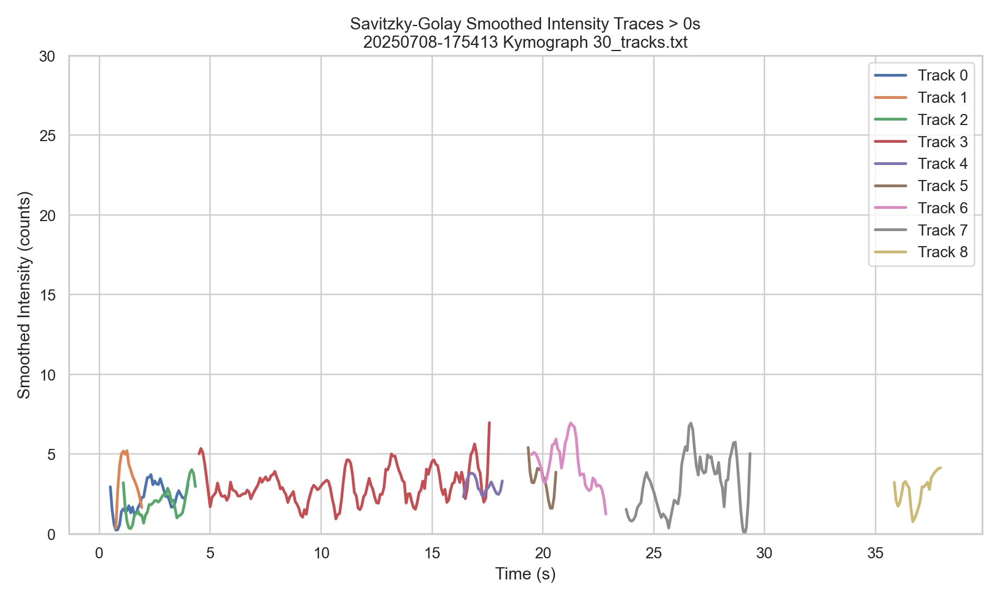

<IPython.core.display.Javascript object>


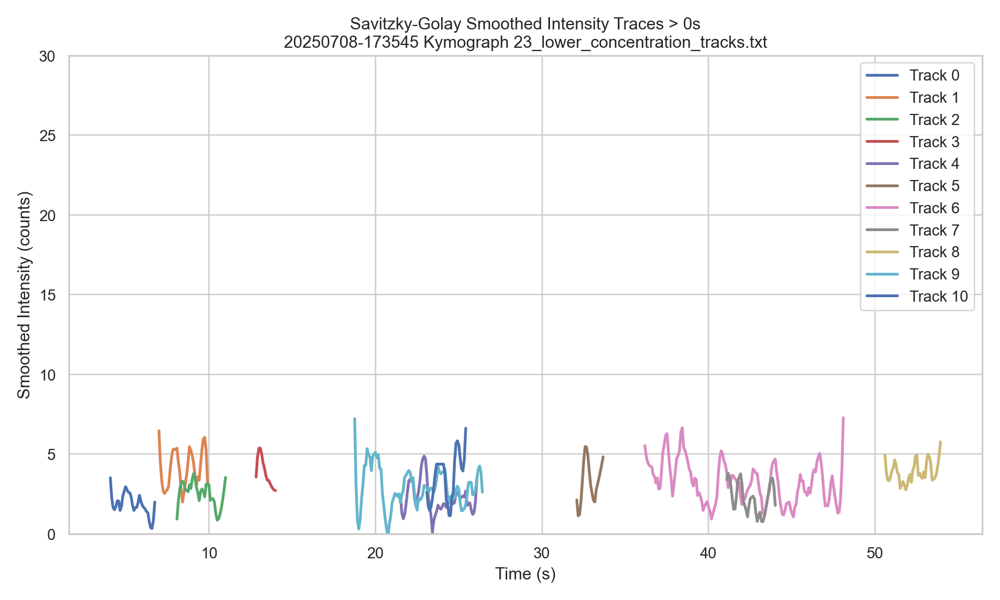

<IPython.core.display.Javascript object>


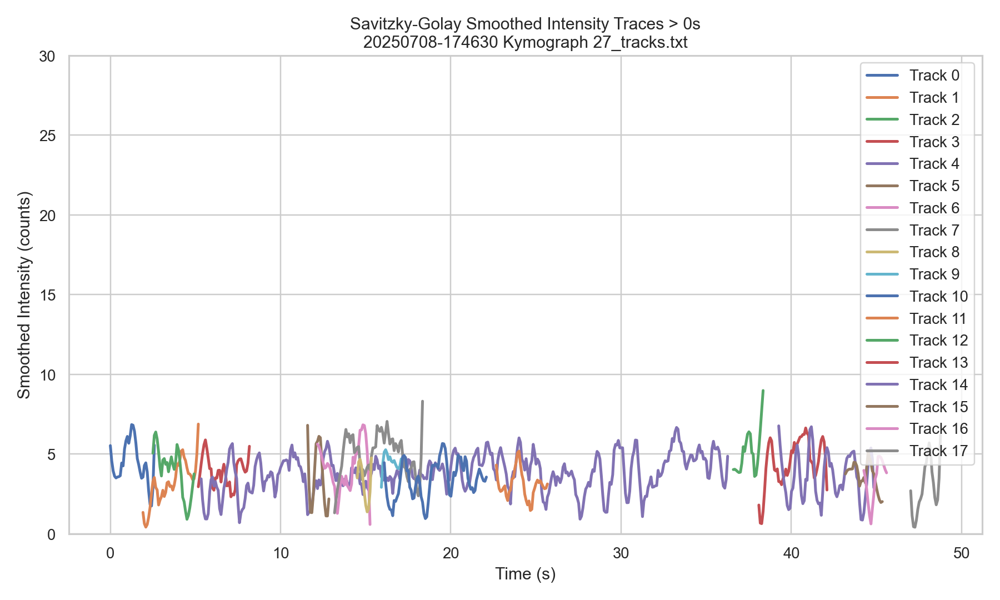

<IPython.core.display.Javascript object>


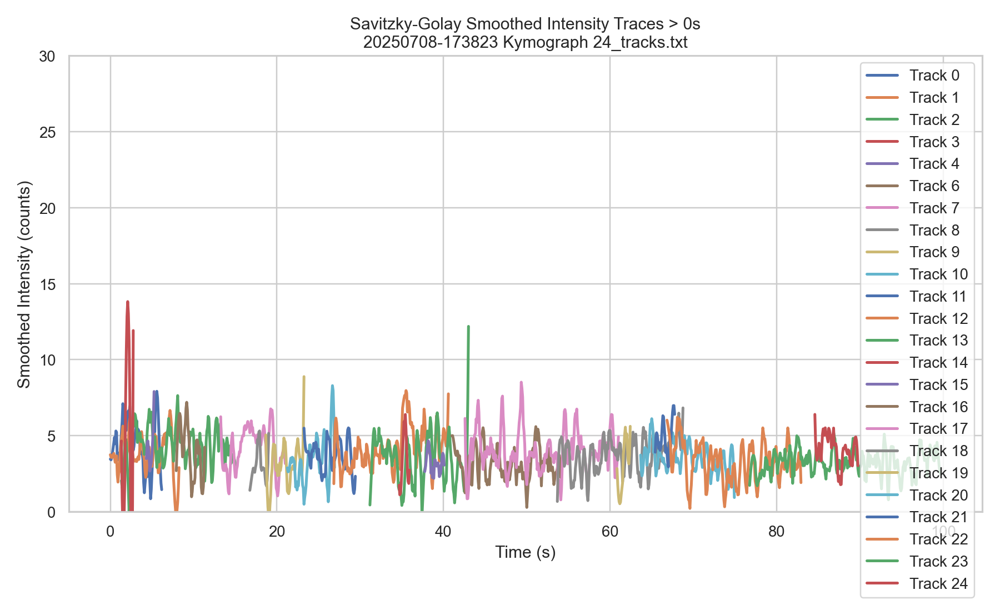

<IPython.core.display.Javascript object>


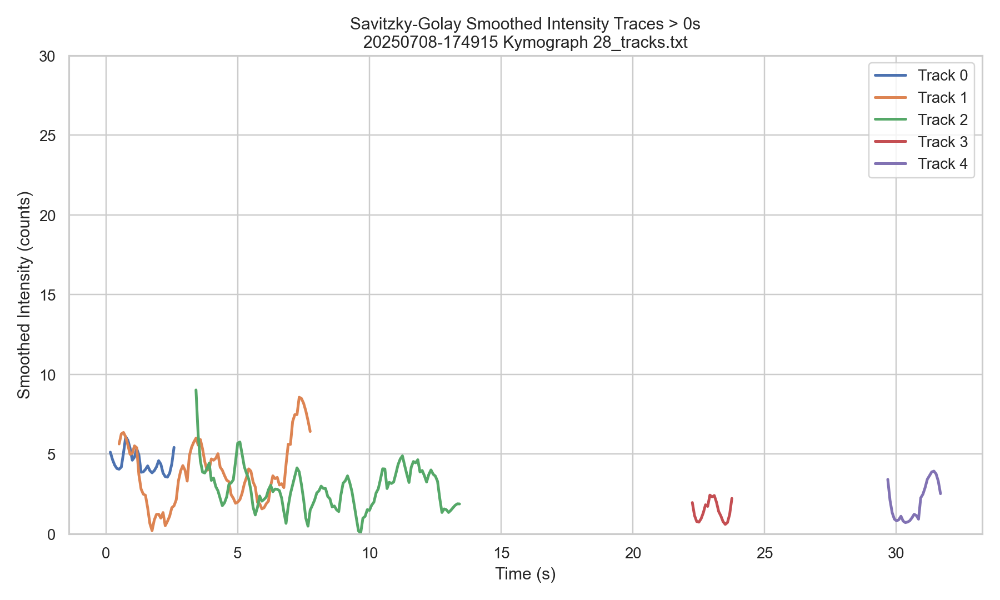

In [277]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
from scipy.signal import savgol_filter

# --- Parameters ---
folder = "ATP_lower_C"
min_dwell_time = 0  # seconds
window_length = 11   # must be odd, increase for more smoothing
polyorder = 3        # 2 or 3 recommended

# --- Find track files ---
track_files = glob.glob(f"{folder}/*tracks.txt")

# --- Process each file ---
for file_path in track_files:
    try:
        df = pd.read_csv(file_path, sep=';', comment='#', header=None)
        df.columns = [
            'track_id', 'time_px', 'coord_px', 'time_s',
            'position_um', 'counts', 'min_obs_duration'
        ]

        # Compute dwell time
        dwell_times = df.groupby('track_id')['time_s'].agg(lambda x: x.max() - x.min())
        long_tracks = dwell_times[dwell_times > min_dwell_time].index

        if long_tracks.empty:
            continue

        # --- Plot ---
        plt.figure(figsize=(10, 6))
        for tid in long_tracks:
            track_df = df[df['track_id'] == tid].copy()

            if len(track_df) >= window_length:
                # Apply Savitzky-Golay smoothing
                track_df['smoothed_counts'] = savgol_filter(
                    track_df['counts'], window_length=window_length, polyorder=polyorder
                )
            else:
                # Skip short tracks that can't be smoothed
                continue

            # Plot the smoothed trace
            plt.plot(track_df['time_s'], track_df['smoothed_counts'], label=f'Track {tid}', linewidth=2)

        plt.title(f'Savitzky-Golay Smoothed Intensity Traces > {min_dwell_time}s\n{os.path.basename(file_path)}')
        plt.xlabel("Time (s)")
        plt.ylabel("Smoothed Intensity (counts)")
        plt.ylim(0, 30)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❌ Could not process {file_path}: {e}")


✅ Mean intensities saved to 'ATP_lower_C_long_dwell_mean_intensities.csv'


<IPython.core.display.Javascript object>


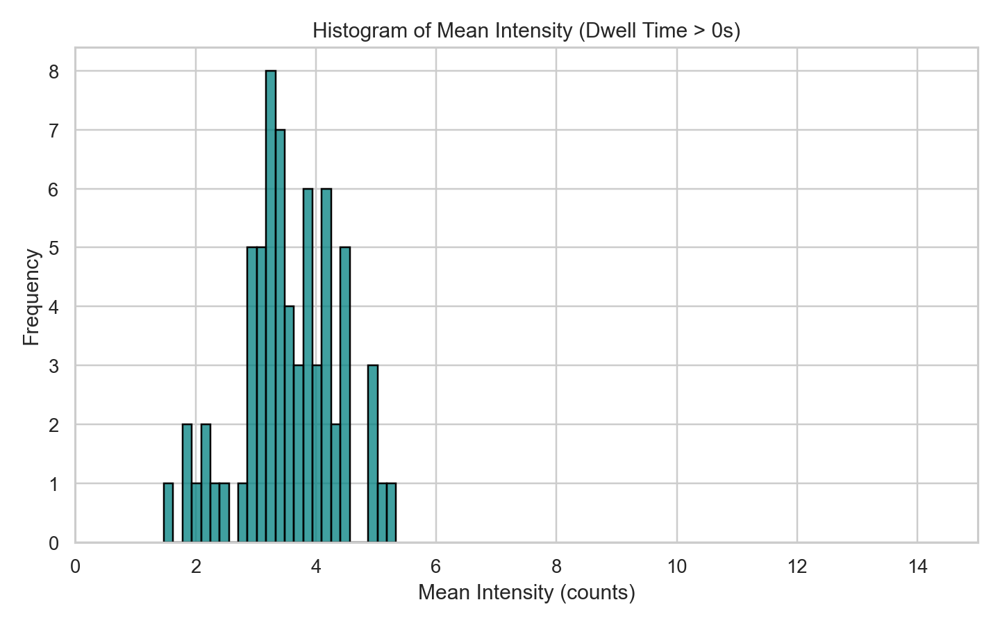

<IPython.core.display.Javascript object>


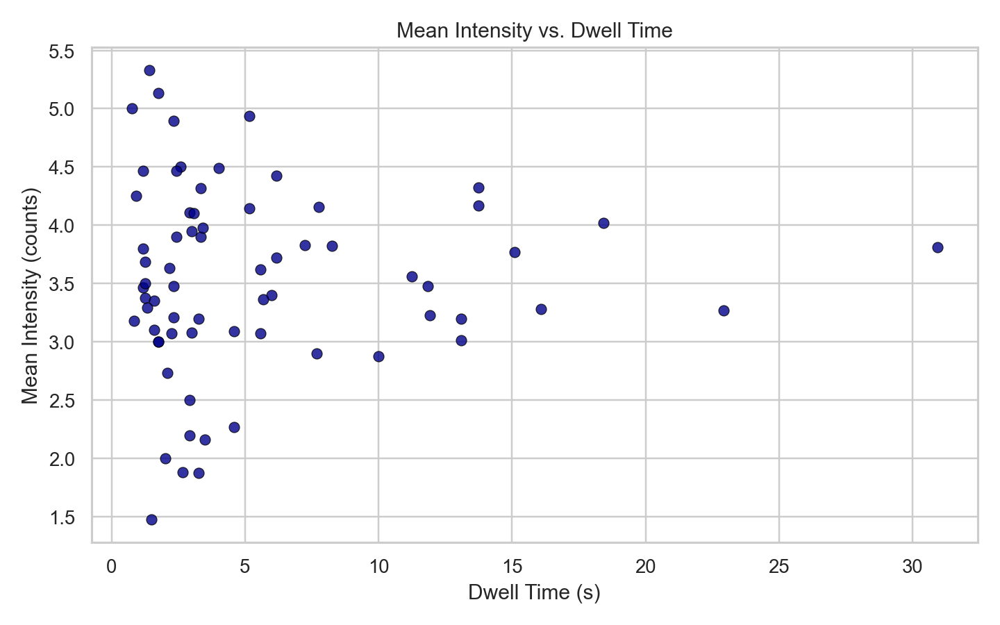

In [284]:
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Parameters
folder = "ATP_lower_C"
min_dwell_time = 0  # seconds

# Collect results
mean_intensity_data = []

track_files = glob.glob(f"{folder}/*tracks.txt")

for file_path in track_files:
    try:
        df = pd.read_csv(file_path, sep=';', comment='#', header=None)
        df.columns = [
            'track_id', 'time_px', 'coord_px', 'time_s',
            'position_um', 'counts', 'min_obs_duration'
        ]

        # Dwell time per track
        dwell_times = df.groupby('track_id')['time_s'].agg(lambda x: x.max() - x.min())
        long_lived_ids = dwell_times[dwell_times > min_dwell_time].index

        for tid in long_lived_ids:
            track_df = df[df['track_id'] == tid]
            mean_intensity = track_df['counts'].mean()
            mean_intensity_data.append({
                'file': os.path.basename(file_path),
                'track_id': tid,
                'dwell_time': dwell_times[tid],
                'mean_intensity': mean_intensity
            })

    except Exception as e:
        print(f"❌ Error processing {file_path}: {e}")

# Create DataFrame
mean_intensity_df = pd.DataFrame(mean_intensity_data)

# Save to CSV
output_file = f"{folder}_long_dwell_mean_intensities.csv"
mean_intensity_df.to_csv(output_file, index=False)
print(f"✅ Mean intensities saved to '{output_file}'")

# --- 📊 Histogram of Mean Intensities ---
plt.figure(figsize=(8, 5))
sns.histplot(mean_intensity_df['mean_intensity'], bins=25, color='teal', edgecolor='black')
plt.title("Histogram of Mean Intensity (Dwell Time > 0s)")
plt.xlabel("Mean Intensity (counts)")
plt.ylabel("Frequency")
plt.xlim(0, 15)
plt.grid(True)
plt.tight_layout()
plt.show()

# --- 🔵 Scatter: Mean Intensity vs. Dwell Time ---
plt.figure(figsize=(8, 5))
sns.scatterplot(
    data=mean_intensity_df,
    x='dwell_time',
    y='mean_intensity',
    alpha=0.8,
    color='darkblue',
    edgecolor='black'
)
plt.title("Mean Intensity vs. Dwell Time")
plt.xlabel("Dwell Time (s)")
plt.ylabel("Mean Intensity (counts)")
plt.grid(True)
plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


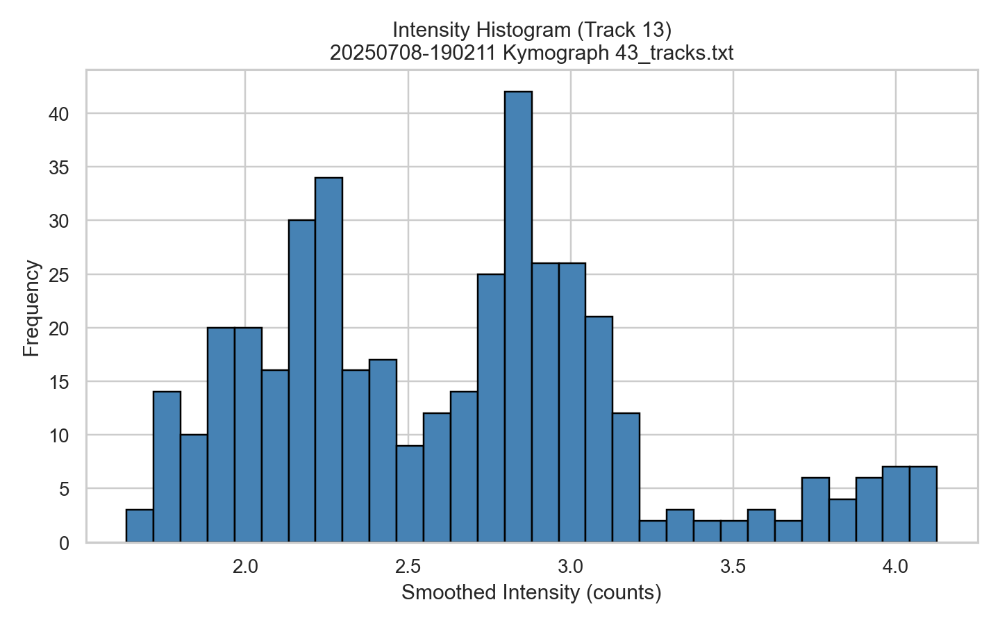

<IPython.core.display.Javascript object>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


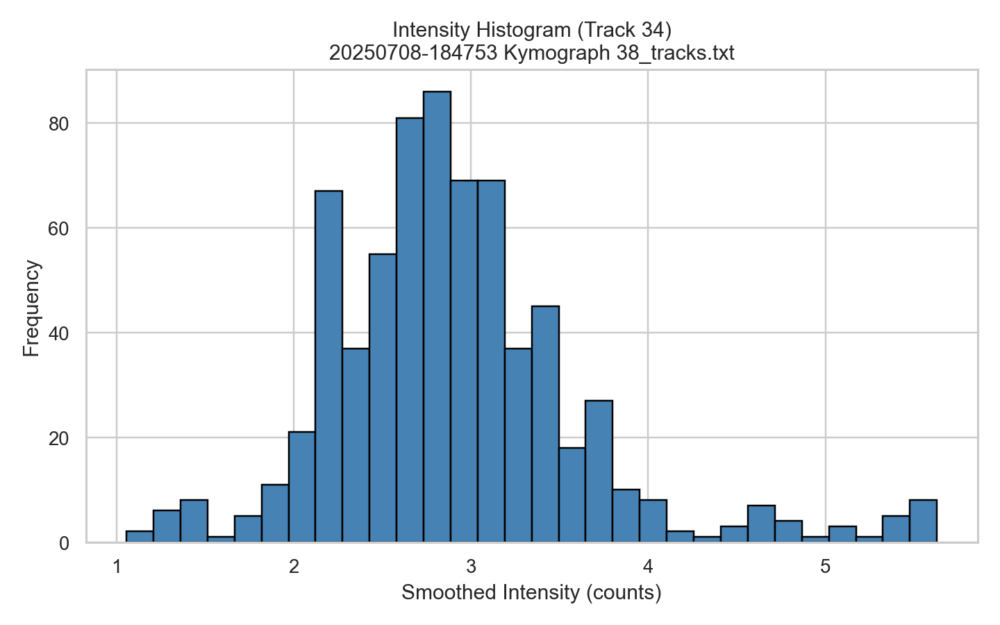

<IPython.core.display.Javascript object>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [303]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
from scipy.signal import savgol_filter

# --- Parameters ---
folder = "ATP_M18"
min_dwell_time = 20  # seconds
window_length = 51   # must be odd
polyorder = 3
intensity_ylim = None  # Set to a value (e.g., 50) to fix y-axis for all histograms
bins = 30  # Number of histogram bins

# --- Find track files ---
track_files = glob.glob(f"{folder}/*tracks.txt")

# --- Process each file ---
for file_path in track_files:
    try:
        df = pd.read_csv(file_path, sep=';', comment='#', header=None)
        df.columns = [
            'track_id', 'time_px', 'coord_px', 'time_s',
            'position_um', 'counts', 'min_obs_duration'
        ]

        # Compute dwell time
        dwell_times = df.groupby('track_id')['time_s'].agg(lambda x: x.max() - x.min())
        long_tracks = dwell_times[dwell_times > min_dwell_time].index

        if long_tracks.empty:
            continue

        for tid in long_tracks:
            track_df = df[df['track_id'] == tid].copy()

            if len(track_df) >= window_length:
                # Smooth intensity
                track_df['smoothed_counts'] = savgol_filter(
                    track_df['counts'], window_length=window_length, polyorder=polyorder
                )
            else:
                continue

            # --- Plot histogram of smoothed intensity ---
            plt.figure(figsize=(8, 5))
            plt.hist(track_df['smoothed_counts'], bins=bins, color='steelblue', edgecolor='black')
            plt.title(f"Intensity Histogram (Track {tid})\n{os.path.basename(file_path)}")
            plt.xlabel("Smoothed Intensity (counts)")
            plt.ylabel("Frequency")
            if intensity_ylim:
                plt.ylim(0, intensity_ylim)
            plt.grid(True)
            plt.tight_layout()
            plt.show()

    except Exception as e:
        print(f"❌ Could not process {file_path}: {e}")
